# 문제 설명
- 로그데이터 분석 및 매출 증가를 위한 액션아이템 도출

- 컬럼 설명

| Property	| Description |
| --- | --- |
| event_time | Time when event happened at (in UTC).|
|event_type	| view / cart / purchase. |
|product_id	|ID of a product|
|category_id|	Product's category ID|
|category_code|	Product's category code name|
|brand|	Downcased string of brand name. <br/> Can be missed.|
|price|	Float price of a product. Present.|
|user_id|	Permanent user ID.|
|user_session|	Temporary user's session ID. <br/> Same for each user's session. <br/> Is changed every time </br> user come back to online store <br/> from a long pause.|
 

## 라이브러리 준비

In [1]:
# 주피터환경에서 코드접기를 위한 라이브러리 설치 
# !pip install jupyter_nbextensions_configurator
# !jupyter nbextensions_configurator enable --user
# !pip install jupyter_contrib_nbextensions
# !jupyter contrib nbextension install --user

# 참고:https://gmnam.tistory.com/224

In [2]:
# plotly 관련 설치
# !pip install plotly
# !pip install chart_studio
# !pip install cufflinks

# parquet 저장 및 로드 라이브러리 설치
# !pip install pyarrow
# !pip install fastparquet
# !python -m pip install --upgrade pip

# 변수명->문자출력
# !pip install varname

In [24]:
# 라이브러리 모음
#데이터셋 처리
import pandas as pd 
import numpy as np
import pyarrow as pa
import pyarrow.parquet as pq
from copy import deepcopy
from collections import defaultdict

#변수명 문자형태로 출력
from varname import nameof
import inspect, re

#시각화
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
rc('mathtext', default='regular')

# 오프라인에서 plotly 그래프 띄우기
import plotly.offline as pyo
import plotly.graph_objects as go
pyo.init_notebook_mode()
# import plotly standard
import plotly.express as px
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
# Cufflinks wrapper on plotly
import cufflinks as cf
# Display all cell outputs
from IPython.core.interactiveshell import InteractiveShell
# plotly + cufflinks in offline mode
from plotly.offline import iplot
cf.go_offline()
# set the global theme
cf.set_config_file(world_readable=True, theme='pearl', offline=True)

#시간 데이터 처리
from datetime import datetime, timedelta, timezone
import datetime as dt
import time
from dateutil import tz

import warnings
warnings.simplefilter("ignore" )

In [63]:
# 그래프 한글폰트 출력을 위한 코드
def get_font_family():
    '''
    시스템 환경에 따른 기본 폰트명을 반환하는 함수
    '''
    import platform
    system_name = platform.system()
    # mac OS 일때
    if system_name == 'Darwin' :
        font_faimly = 'AppleGothic'
    # 윈도우일떄 
    elif system_name == 'Windows':
        font_family = 'Malgun Gothic'
    else:
        # Linux(colab)
        !apt-get install fonts-nanum -qq > /dev/null
        !fc-cache -fv

        import matplotlib as mpl
        mpl.font_manager._rebuild()
        findfont = mpl.font_manager.fontManager.findfont
        mpl.font_manager.findfont = findfont
        mpl.backends.backend_agg.findfont = findfont

        font_family = 'NanumBarunGothic'

    return font_family

# style 설정은 꼭 폰트설정 위에서 한다. 
# style에 폰트 설정이 들어있으면 한글폰트가 초기화 되어 깨진다.
# plt.style.use('seaborn')

#폰트설정
plt.rc('font', family=get_font_family())

#마이너스폰트 설정
plt.rc('axes', unicode_minus=False)

# 그래프에 retina display 적용
# 그래프 해상도 
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

---

# 전처리

## 데이터 포맷 변경 (CSV -> Parquet)
- 파일의 용량이 각각 5GB 내외로 매우 크다
    - RAM에 무리
    - 분석시 소요시간 증가
- 용량 축소를 위하여 CSV형태의 파일을 Parquet 형태로 변환하여 용량을 줄인다.
- **최초 1회 실행** (local환경 소요시간 약 20분)

In [5]:
# 데이터 포맷 변경

# import os

# PATH_INPUT = './input/'

# def csv_to_parquet(lst):
#     '''csv파일을 parquet형태로 변환하여 저장하는 함수'''
    
#     for file in lst:
#         csv_file = PATH_INPUT + f'{file}.csv'
#         parquet_file = PATH_INPUT + f'{file}_transformed.parquet'
        
#         chunksize = 1000000
#         csv_stream = pd.read_csv(csv_file, sep=',', chunksize=chunksize, low_memory=False)

#         print('현재파일', file)
#         for i, chunk in enumerate(csv_stream, start=1):
#             print("Chunk", i)
#             if i == 1:
#                 # 스키마 설정(csv형태 그대로)
#                 parquet_schema = pa.Table.from_pandas(df=chunk).schema
#                 # Open a Parquet file for writing
#                 parquet_writer = pq.ParquetWriter(parquet_file, parquet_schema, compression='ZSTD')
#             # Write CSV chunk to the parquet file
#             table = pa.Table.from_pandas(chunk, schema=parquet_schema)
#             parquet_writer.write_table(table)
        
#         # 매 파일 종료 시, 파일 변환 전/후 용량 출력
#         csv_size = os.path.getsize(csv_file)
#         parquet_size = os.path.getsize(parquet_file)
#         print(file,"변환 전 : {:.2f} MB".format(csv_size / (1024 ** 2)))
#         print(file,"변환 후 : {:.2f} MB".format(parquet_size / (1024 ** 2)))
#         print('\n')
#     else :
#         parquet_writer.close()

# # 2019년 10월부터 2020년 4월까지의 데이터 변환
# file_list = ['2019-Oct','2019-Nov','2019-Dec', '2020-Jan','2020-Feb','2020-Mar','2020-Apr']
# csv_to_parquet(file_list)        

---

## 결측치 처리 및 자료형 변환
1. 컬럼 제거 
    - `category_id` : 불필요. category_code로 대체
2. 결측치 처리
    - `user_session` : user_id, event_time 기준으로 정렬 후, forward fill 방식으로 해결
    - `category_code`, `brand` : 'unknown'문자열로 대체, 분석에 사용
3. 자료형 변환
    - datetime : `event_time`
    - category : `evnet_type`, `category_code`  (용량축소, object->category)
    - float32 : `price` (용량축소, float64->float32)
    - int32 : `user_id` (용량축소, int64->int32)

In [6]:
# 결측치 처리 및 자료형 변환 함수 생성
# def feature_engineering(df):
#     # 1. category_id 제거
#     df = df.drop('category_id', axis=1)
    
#     # 1. 결측 치 처리
#     # 1-1. user_session -> user_id, event_time 순으로 정렬 후 ffill 방식 사용
#     df['user_session'] = df.sort_values(['user_id','event_time'])['user_session'].fillna(method='ffill')

#     # 1-2. category_code, brand -> unknown 정보없음 으로 대체 
#     df = df.fillna('unknown')
    
#     # 2. dtypes 변경
#     # category 변환
#     df[['event_type','category_code']] = df[['event_type','category_code']].astype('category')
    
#     # int 변환
#     df[['user_id', 'product_id']] = df[['user_id', 'product_id']].astype('int32')
    
#     # float 변환
#     df['price'] = df['price'].astype('float32')
    
#     # datetime 변환
#     df['event_time'] = pd.to_datetime(df['event_time'], format = '%Y-%m-%d %H:%M:%S UTC')    
    
#     return df

- parquet 파일 로드 -> 전처리 -> parquet 저장
- 이후부터는 parquet 로딩 후 바로 분석 진행
- **최초 1회 실행**

In [7]:
# 실시코드

# file_list = ['2019-Oct','2019-Nov', '2019-Dec', '2020-Jan','2020-Feb','2020-Mar','2020-Apr']
# PATH_INPUT = './input/'

# # 중복값 제거 기준
# cols = ['event_time','event_type','product_id','user_id']
# for fname in file_list:
#     print(fname)
    
#     # parquet 불러오기
#     PATH = PATH_INPUT + f'{fname}_transformed.parquet'
#     df_loaded = pd.read_parquet(PATH, engine='pyarrow')
#     print(fname, '불러오기 완료')
#     time.sleep(5)
    
#     # 결측치 및 자료형 변경
#     df_engineered = feature_engineering(df_loaded)
#     print(fname,'결측치 및 자료형 변경 완료')
#     time.sleep(5)

    
#     # 전처리 결과 내보내기
#     F_PATH_output = PATH_INPUT + f'{fname}_engineered.parquet'
#     df_engineered.to_parquet(F_PATH_output, engine='pyarrow', index=False, compression='ZSTD')
#     time.sleep(5)   
    
#     print('전처리 및 결과물 내보내기 완료', end='\n')                   

## 중복값 확인 및 제거
- `event_time`,`event_type`,`product_id`,`user_id` 4가지의 컬럼을 이용하여 중복값 확인
    - 모든 column 사용시 dead kernel 발생

- event_time컬럼은 초 단위로 기록되어 있다.
- **한 유저가 같은 시간(초단위)에 동일한 이벤트를 여러개 생성한다는 것을 비정상으로 추정하고 제거한다.**

In [8]:
# 중복값 제거 및 내보내기
# # 데이터셋 파일명
# file_list = ['2019-Oct','2019-Nov', '2019-Dec', '2020-Jan','2020-Feb','2020-Mar','2020-Apr']

# # 데이터셋 변수명 
# df_lst = ['df_19_oct', 'df_19_nov', 'df_19_dec', 'df_20_jan', 'df_20_feb', 'df_20_mar', 'df_20_apr']

# # 중복검사 대상
# cols = ['event_time','event_type','product_id','user_id']

# PATH_INPUT = './input/'

# for fname, df in zip(file_list, df_lst):
#     PATH = PATH_INPUT + f'{fname}_engineered.parquet'
    
#     # file명 이용하여 변수명 지정
#     tmp = 'df_'+fname[2:].lower().replace('-','_') 
#     locals()[tmp] = pd.read_parquet(PATH, engine='pyarrow')
#     print(fname, '불러오기 완료')
    
#     # 중복값 제거
#     print('중복값 제거 전 shape :', locals()[df].shape)
#     locals()[df] = locals()[df].drop_duplicates(subset=cols, keep='first')
#     print('중복값 제거 후 shape :', locals()[df].shape)    
    
#     # 전처리 결과 내보내기
#     F_PATH_output = PATH_INPUT + f'{fname}_engineered(drop_dup).parquet'
#     locals()[df].to_parquet(F_PATH_output, engine='pyarrow', index=False, compression='ZSTD')
    
    
#     # 메모리 제거
#     del locals()[df]
#     print(df, '메모리제거 완료')
#     print('=='*10)
#     time.sleep(5)

---

# EDA

## Load Dataset

In [9]:
# file_list = ['2019-Oct','2019-Nov', '2019-Dec', '2020-Jan','2020-Feb','2020-Mar','2020-Apr']
file_list = ['2019-Oct','2019-Nov']

PATH_INPUT = './input/'

for fname in file_list:
    PATH = PATH_INPUT + f'{fname}_engineered(drop_dup).parquet'
    
    # file명 이용하여 변수명 지정
    tmp = 'df_'+fname[2:].lower().replace('-','_') 
    locals()[tmp] = pd.read_parquet(PATH, engine='pyarrow')
    
    
    print(fname, locals()[tmp].shape)
    print('=='*10)
    
    time.sleep(5)

2019-Oct (42413557, 8)
2019-Nov (67392950, 8)


## 컬럼 자료형 확인
- `event_time` : 로그 발생시간
- `event_type` : 로그 종류 3가지 (view/cart/purchase), category
- `category_id` : 카테고리 id, int
- `category_code` : 카테고리 code, object
- `brand` : 제품 브랜드, object
- `price` : 제품 가격, float
- `user_id` : 유저 id, int
- `user_session` : 유저 세션, object

In [10]:
# 메모리 1.5GB+ -> batch처리 가능한지 추후 학습 및 적용
df_19_oct.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42413557 entries, 0 to 42413556
Data columns (total 8 columns):
 #   Column         Dtype         
---  ------         -----         
 0   event_time     datetime64[ns]
 1   event_type     category      
 2   product_id     int32         
 3   category_code  category      
 4   brand          object        
 5   price          float32       
 6   user_id        int32         
 7   user_session   object        
dtypes: category(2), datetime64[ns](1), float32(1), int32(2), object(2)
memory usage: 1.5+ GB


---

---

## 단일컬럼 확인

### `event_time`
- 일자별로 샘플링 후(10%) 시각화 진행 
    - 경향성만 보면 되는데, full dataset 사용시 시간이 오래 걸린다.
    - z-test를 통한 모집단에서의 일자별 비율과, 표본에서의 일자별 비율 비교
        - H0 : 두 집단간의 비율 차이 없다.
        - H1 : 두 집단간의 비율 차이 있다.
            - 모든 일자에서 p-value : 0.99 이므로 귀무가설 채택한다. 
            - **'두 집단간의 비율 차이 없다'**
            
    
        

#### 샘플링

In [11]:
# 샘플링 및 일자별 비율검정 (모비율 vs 샘플비율)
by = df_19_oct['event_time'].dt.dayofyear
df_samp = df_19_oct.groupby(by).sample(frac=0.1, random_state=27).sort_index()
print(df_samp.shape)
df_samp.head()

(4241354, 8)


,event_time,event_type,product_id,category_code,brand,price,user_id,user_session
4,2019-10-01 00:00:04,view,1004237,electronics.smartphone,apple,1081.979980,535871217,c6bd7419-2748-4c56-95b4-8cec9ff8b80d
6,2019-10-01 00:00:08,view,17300353,unknown,creed,380.959991,555447699,4fe811e9-91de-46da-90c3-bbd87ed3a65d
9,2019-10-01 00:00:11,view,1004545,electronics.smartphone,huawei,566.010010,537918940,406c46ed-90a4-4787-a43b-59a410c1a5fb
17,2019-10-01 00:00:18,view,10900029,appliances.kitchen.mixer,bosch,58.950001,519528062,901b9e3c-3f8f-4147-a442-c25d5c5ed332
24,2019-10-01 00:00:23,view,6200260,appliances.environment.air_heater,midea,47.619999,538645907,7d9a8784-7b6c-426e-9924-9f688812fd71


- 샘플과 모집단간 일자별 비율 검정

In [12]:
# 모집단, 표본집단 생성 - 일자별 event_count 
prop = df_19_oct['event_time'].dt.dayofyear.value_counts().sort_index()
samp = df_samp['event_time'].dt.dayofyear.value_counts().sort_index()

In [13]:
# H0 채택 '모든 날짜의 비율차이는 없다'

# H0 : 두 집단간 비율 차이가 없다.
# H1 : 두 집단간 비율 차이가 있다.

from statsmodels.stats.proportion import proportions_ztest

n_day_rows = np.array([prop.sum(), samp.sum()])

for d, p, s in zip(prop.index, prop.values, samp):
    n_day = np.array([p, s])
    z_score, p_value = proportions_ztest(count=n_day, nobs=n_day_rows, 
                                         alternative='two-sided')
    print(f'{d}일 - p_value:{p_value}')

274일 - p_value:0.9994522794021067
275일 - p_value:0.9989987865753647
276일 - p_value:0.9991848113879719
277일 - p_value:0.9994720211473208
278일 - p_value:0.9996889329637718
279일 - p_value:0.9998875816122142
280일 - p_value:0.999224463683306
281일 - p_value:0.9990495047139
282일 - p_value:0.9996923705724862
283일 - p_value:0.9996734225503048
284일 - p_value:0.999679638666599
285일 - p_value:0.9993139657331673
286일 - p_value:0.9995507761471824
287일 - p_value:0.9997121517435846
288일 - p_value:0.9995295898918608
289일 - p_value:0.999481560742917
290일 - p_value:0.9999099185659129
291일 - p_value:0.9991130698250281
292일 - p_value:0.9998819429475211
293일 - p_value:0.9999211265212942
294일 - p_value:0.9997032006157069
295일 - p_value:0.9990606729327917
296일 - p_value:0.9998848484802979
297일 - p_value:0.9992598796873173
298일 - p_value:0.9999130536972984
299일 - p_value:0.999270752527656
300일 - p_value:0.9998845275339768
301일 - p_value:0.9996725450454778
302일 - p_value:0.9994471611963647
303일 - p_value:0.9996

#### 시각화 - 특성공학 전

- 주차별 (월~일)
    - 40주차 : 화-일 (6일)
    - 41~43주차 : 정상 (7일)
    - 44주차 : 월-목 (4일)
- **44주차의 금,토,일(11월1일~3일) 데이터를 11월 데이터로부터 추출하여 concat 필요**

- 일별 (1~31일)
    - 월초,월말이 중순에 비해 event수가 상대적으로 적다.
    - event_type과 복합 분석 필요
<br><br/>  
- 요일별
    - 월요일 : 10월초 생략
    - 금~일요일 : 10월말 생략
    - **'주차-요일별' 혹은 event_type과 복합하여 분석필요**
<br><br/>  
- 시간별
    - 새벽 2시부터 event수가 증가하기 시작해서 16시에 가장 많은 event수를 보인다. -> 이상하다
    - 데이터셋의 timezone이 'UTC 0'으로 설정되어 있다. 
    - **카자흐스탄(동부, 알마티) 국가의 이커머스 데이터셋으로 가정하였으므로 시간대 UTC+6으로 시간 변경**

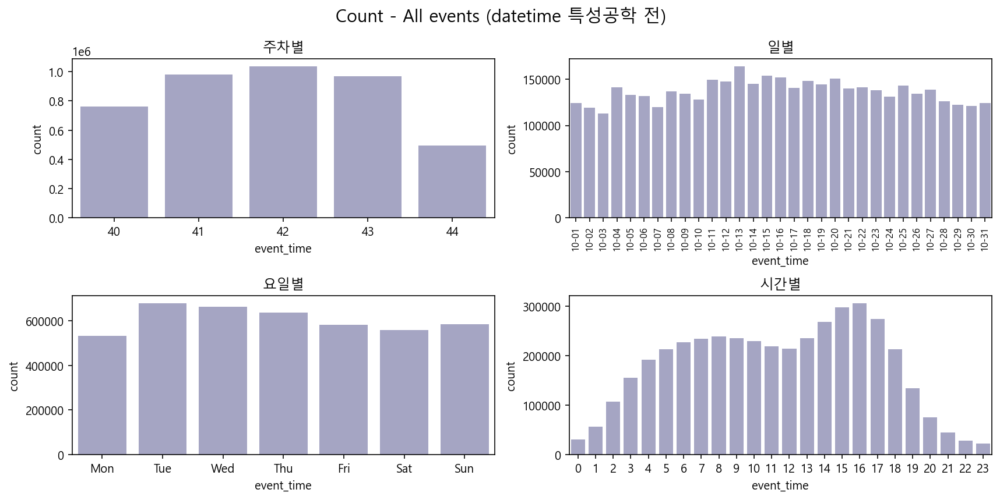

In [14]:
# 시각화 code

fig, ax = plt.subplots(2,2, figsize=(12,6))

# 주
x = df_samp['event_time'].dt.week
sns.countplot(x = x, color='#A0A0C8', ax=ax[0,0])
ax[0,0].set_title('주차별')

# 일
x = df_samp['event_time'].dt.strftime('%m-%d')
g = sns.countplot(x = x, color='#A0A0C8', ax=ax[0,1])
g.set_xticklabels(g.get_xticklabels(),fontsize=8, rotation=90)
ax[0,1].set_title('일별')

# 요일
x = df_samp['event_time'].dt.dayofweek
dow_label = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
sns.countplot(x = x, color='#A0A0C8', ax=ax[1,0])
ax[1,0].set_title('요일별')
ax[1,0].set_xticklabels(dow_label)

# 시간
x = df_samp['event_time'].dt.hour
sns.countplot(x= x, color='#A0A0C8', ax=ax[1,1])
ax[1,1].set_title('시간별')

fig.suptitle('Count - All events (datetime 특성공학 전)', fontsize=15)
fig.tight_layout()
plt.show()

- timezone 변경 (UTC 0 -> UTC+6)

In [15]:
# time zone 변경
# df_lst = ['df_19_oct', 'df_19_nov', 'df_19_dec', 
#           'df_20_jan', 'df_20_feb', 'df_20_mar', 'df_20_apr']
df_lst = ['df_19_oct','df_19_nov']

for df in df_lst:
    print(df)
    locals()[df]['event_time'] = locals()[df]['event_time'].dt.tz_localize(tz.UTC)        # UTC localize
    print('변경 전:',locals()[df]['event_time'][0] )
    locals()[df]['event_time'] = locals()[df]['event_time'].dt.tz_convert('Asia/Almaty')  # 알마티(카자흐스탄) 시간대 적용
    print('변경 후:',locals()[df]['event_time'][0] )
    print('========'*5)

df_19_oct
변경 전: 2019-10-01 00:00:00+00:00
변경 후: 2019-10-01 06:00:00+06:00
df_19_nov
변경 전: 2019-11-01 00:00:00+00:00
변경 후: 2019-11-01 06:00:00+06:00


- 11월 1~3일 데이터 추출 및 10월 마지막에 concat

In [16]:
# 11월 1~3일 데이터 추출 및 10월 데이터에 concat
condition = df_19_nov['event_time'].dt.week == 44
tmp = df_19_nov[condition]

df_19_oct = pd.concat([df_19_oct, tmp]).reset_index(drop=True)
print('df - tail')
df_19_oct.tail(2)

df - tail


,event_time,event_type,product_id,category_code,brand,price,user_id,user_session
46735260,2019-11-03 23:59:59+06:00,view,22700541,unknown,unknown,14.160000,567089454,cf668a7f-19ed-4ec5-89d1-da8b755553ff
46735261,2019-11-03 23:59:59+06:00,view,1004956,electronics.smartphone,xiaomi,382.119995,562015918,59cf6e10-ea4e-432e-9d16-37b2c6a6d8d4


- 11월 데이터 병합 후 자료형 확인 
    - `category_code`,`brand` : 10월 데이터에는 없던 새로운 개체가 생성되면서 category가 object로 변환됐다.
        - 다시 category로 변경

In [17]:
df_19_oct.dtypes

event_time       datetime64[ns, Asia/Almaty]
event_type                          category
product_id                             int32
category_code                         object
brand                                 object
price                                float32
user_id                                int32
user_session                          object
dtype: object

In [18]:
def convert_dtype(df):
    df[['category_code','brand']] = df[['category_code','brand']].astype('category')
    return df

df_19_oct = convert_dtype(df_19_oct)

In [19]:
df_19_oct.dtypes

event_time       datetime64[ns, Asia/Almaty]
event_type                          category
product_id                             int32
category_code                       category
brand                               category
price                                float32
user_id                                int32
user_session                          object
dtype: object

#### 시각화 - 특성공학 후 - 1

- 주차별 (월~일)
    - 11월 1~3일 데이터 추출 및 concat 완료
<br><br/>        
- 일별 (10월1일~11월3일)
    - timezone 변경으로, 10월 1일 일부데이터 (00시~5시59분59초)누락     
    - **event_type과 복합 분석 필요**
<br><br/>  
- 요일별
    - 월요일 : 9월30일(월) 누락
    - **'주차-요일별' 혹은 event_type과 복합하여 분석필요**
<br><br/>  
- 시간별
    - 카자흐스탄(동부, 알마티) timezone으로 변경 완료 (UTC+6)
    - 10월 1일 0~5시 59분 59초 데이터 누락

In [20]:
# 재 샘플링
by = df_19_oct['event_time'].dt.dayofyear
df_samp = df_19_oct.groupby(by).sample(frac=0.1, random_state=27).sort_index()
print(df_samp.shape)
df_samp.tail()

(4673528, 8)


,event_time,event_type,product_id,category_code,brand,price,user_id,user_session
46735238,2019-11-03 23:59:59+06:00,view,26401457,unknown,lucente,114.550003,517323198,23e70f5f-9038-4d93-a2db-42a122902eb2
46735246,2019-11-03 23:59:59+06:00,view,1201391,electronics.tablet,apple,1518.439941,513763965,a89b1a45-ab99-41b5-bc62-6adb7d2b7994
46735247,2019-11-03 23:59:59+06:00,view,1004767,electronics.smartphone,samsung,241.860001,545052249,baf5e123-6f21-4e39-a9dc-f65001f8a556
46735248,2019-11-03 23:59:59+06:00,view,28721240,apparel.shoes,unknown,86.230003,557442625,829edaab-a9a0-4c5c-a237-b0ab960401cf
46735258,2019-11-03 23:59:59+06:00,view,28716595,apparel.shoes,baden,53.799999,515166728,3ed362b8-478e-4b1a-9d07-4bb078baca29


- 연한색상 : 불완전 데이터(일부 데이터 누락)

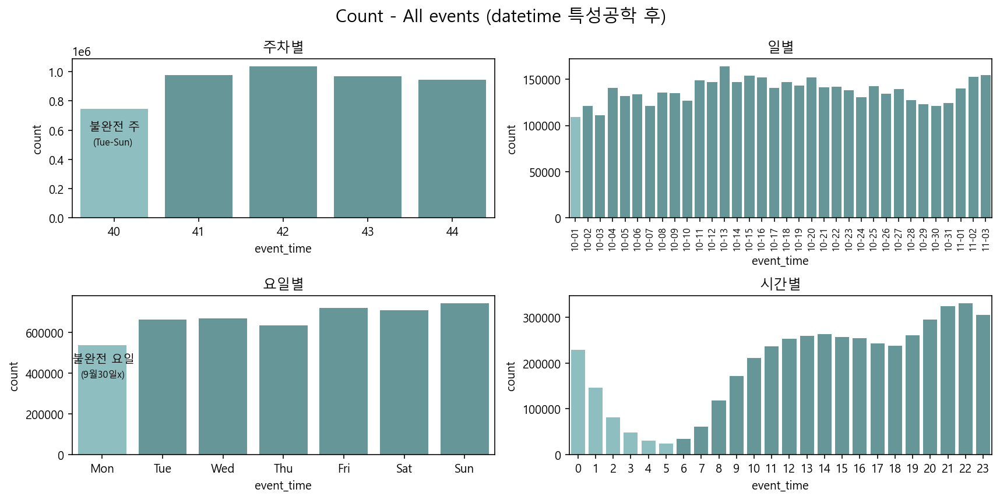

In [21]:
# 시각화
fig, ax = plt.subplots(2,2, figsize=(12,6))

# 주
x = df_samp['event_time'].dt.week
len_x = x.nunique()
pal = ['#87C6C8'] +  ['#5F9EA0'] * (len_x - 1)
g = sns.countplot(x = x, palette=pal, ax=ax[0,0])
g.set_title('주차별')
g.text(-0.3,0.6e6,'불완전 주')
g.text(-0.25,0.5e6,'(Tue-Sun)', fontsize=8)

# 일
x = df_samp['event_time'].dt.strftime('%m-%d')
len_x = x.nunique()
pal = ['#87C6C8'] +  ['#5F9EA0'] * (len_x - 1)
g = sns.countplot(x = x, palette=pal, ax=ax[0,1])
g.set_title('일별')
g.set_xticklabels(g.get_xticklabels(),fontsize=8, rotation=90)

# 요일
x = df_samp['event_time'].dt.dayofweek
len_x = x.nunique()
pal = ['#87C6C8'] +  ['#5F9EA0'] * (len_x - 1)
g = sns.countplot(x = x, palette=pal, ax=ax[1,0])
g.set_title('요일별')
g.text(-0.5, 4.5e5, '불완전 요일')
g.text(-0.35, 3.8e5, '(9월30일x)', fontsize=8)
dow_label = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
g.set_xticklabels(dow_label)

# 시간
x = df_samp['event_time'].dt.hour
len_x = x.nunique()
pal = (['#87C6C8'] * 6) +  (['#5F9EA0'] * (len_x - 6))
g = sns.countplot(x = x, palette=pal, ax=ax[1,1])
g.set_title('시간별')

fig.suptitle('Count - All events (datetime 특성공학 후)', fontsize=15)
fig.tight_layout()
plt.show()

- event_time 분석시에는 40주차 데이터를 통으로 날리고 사용
- 다른 분석에는 기존 데이터 계속 사용

In [22]:
# 40주차 제거
df_wo_w40 = df_19_oct[df_19_oct['event_time'].dt.week > 40]

# 샘플링
by = df_wo_w40['event_time'].dt.dayofyear
df_samp = df_19_oct.groupby(by).sample(frac=0.1, random_state=27).sort_index()
print(df_samp.shape)
df_samp.tail()

(3926696, 8)


,event_time,event_type,product_id,category_code,brand,price,user_id,user_session
46735232,2019-11-03 23:59:59+06:00,view,5100767,unknown,samsung,30.610001,516622972,4d1ca9d9-2113-4b15-bc02-3d3cedd9cb52
46735238,2019-11-03 23:59:59+06:00,view,26401457,unknown,lucente,114.550003,517323198,23e70f5f-9038-4d93-a2db-42a122902eb2
46735240,2019-11-03 23:59:59+06:00,view,1004870,electronics.smartphone,samsung,271.399994,516774255,87adee96-5635-4c6d-b0cb-b8bf0c73b367
46735244,2019-11-03 23:59:59+06:00,view,5000500,appliances.sewing_machine,janome,135.960007,513902482,eb1d43d0-f95f-4552-b836-e964024f1c40
46735257,2019-11-03 23:59:59+06:00,view,1004718,electronics.smartphone,haier,77.199997,561765733,bafdd7cd-77be-42f7-8eb4-d01ec78a1703


#### 시각화 - 특성공학 후 - 2

- 주차별
    - 42주차에 event가 가장 많고, 44주차에 가장 적다.
- 일별
    - 41주차 마지막인 13일에 가장 많은 이벤트가 발생
    - 10월 말까지 점점 하락했다가 11월 1일부터 급상승
- 요일
    - 평일(월-목) vs 주말(금-일) 주말의 이벤트 수가 평일대비 높다.
- 시간
    - 오후 9~10시에 가장 높은 수를 보이며, 새벽에는 급격히 감소한다.

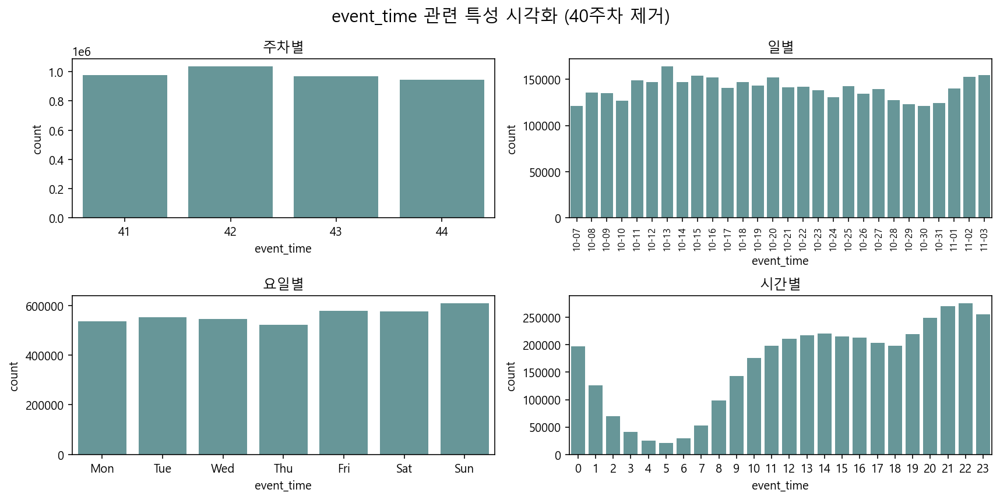

In [23]:
# 시각화
fig, ax = plt.subplots(2,2, figsize=(12,6))

color = '#5F9EA0'

# 주
x = df_samp['event_time'].dt.week
g = sns.countplot(x = x, color=color, ax=ax[0,0])
g.set_title('주차별')

# 일
x = df_samp['event_time'].dt.strftime('%m-%d')
g = sns.countplot(x = x, color=color, ax=ax[0,1])
g.set_title('일별')
g.set_xticklabels(g.get_xticklabels(),fontsize=8, rotation=90)

# 요일
x = df_samp['event_time'].dt.dayofweek
g = sns.countplot(x = x, color=color, ax=ax[1,0])
g.set_title('요일별')
dow_label = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
g.set_xticklabels(dow_label)

# 시간
x = df_samp['event_time'].dt.hour
g = sns.countplot(x = x, color=color, ax=ax[1,1])
g.set_title('시간별')

fig.suptitle('event_time 관련 특성 시각화 (40주차 제거)', fontsize=15)
fig.tight_layout()
plt.show()

---

### `event_type`

- view 대비 cart, purchase가 매우 낮다.
    -> 구매 전환이 낮다

In [468]:
# event_type별 event 발생 수
grouped = df_19_oct['event_type'].value_counts().reset_index() \
            .rename(columns={'event_type':'counts','index':'event_type'})
grouped

,event_type,counts
0,view,44904188
1,cart,952996
2,purchase,806709


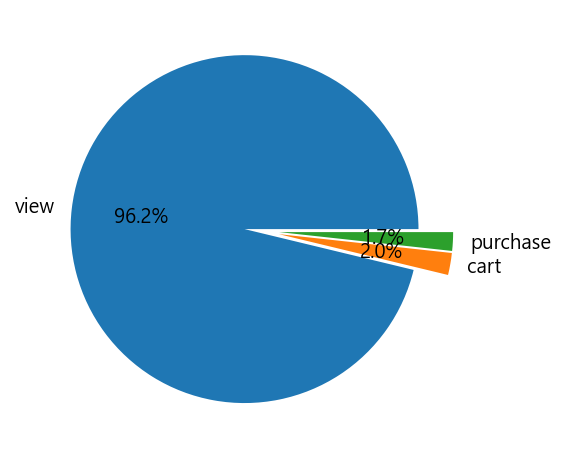

In [470]:
plt.pie(x='counts', labels='event_type', data=grouped, autopct='%.1f%%', explode=[0.1, 0.1, 0.1])
plt.show()

- Funnel 분석
    - 고객의 유입시점부터 설정한 목표(구매, 회원가입 등)까지의 단계별 프로세스를 분석
    - 해당 과제는 `Product View -> Add to Cart -> Purchase` 3단계를 이용한다. 

- Funnel로 목표 달성하기
1. 유입을 폭발적으로 늘린다.
2. 전환율을 개선한다. 
    -> 해당과제에서는 유입은 많지만 전환율이 매우 낮으므로 전환율을 개선할 방법을 최우선으로 찾아야 한다.

![image](https://user-images.githubusercontent.com/65796882/196649052-2d33f4ba-ef0e-4e0b-ab50-cf41062b02c4.png)
(image source : https://www.webdew.com/blog/how-to-conduct-a-funnel-analysis)


In [471]:
# event_type별 event 발생 비율
grouped = round(df_19_oct['event_type'].value_counts(normalize=True)*100,2)
grouped = grouped.reset_index().rename(columns={'event_type':'prop. (%)','index':'event_type'})
fig = px.funnel(grouped, y='event_type', x='prop. (%)',
               width=500, height=300)
fig.show()

---

### `product_id`

- 제품번호 고유개수 17만개
- 카테고리로 제품 종류는 추정 가능
<br/><br/>
- 100만번대(1M) product_id 종류가 전체의 2.9% 차지하는데, event 발생횟수는 34.3% 나 차지한다.
    - 100만번대의 카테고리 코드 확인
- 이벤트 발생 상위 20개 중 2가지(4804056, 5100816)을 제외한 product_id가 100으로 시작

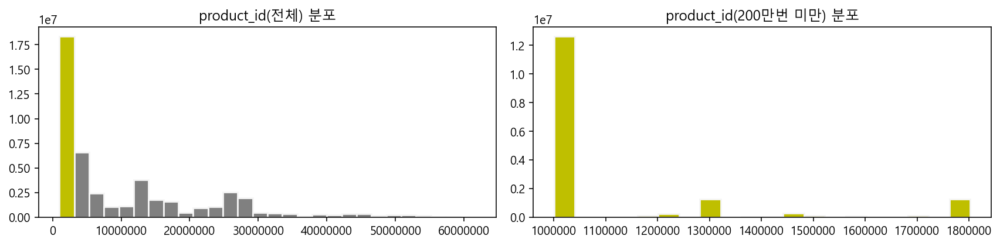

In [27]:
# 대략적인 분포 - 전체 번호
# 10M이하에 대부분의 이벤트가 몰려있다.
fig, ax = plt.subplots(1,2 , figsize=(12,3))

ax[0].hist(x=df_19_oct['product_id'], bins=28, color= 'gray',
          edgecolor = 'whitesmoke', linewidth = 1.4)
ax[0].title.set_text('product_id(전체) 분포')
ax[0].ticklabel_format(axis='x', style='plain') #x축 눈금 지수표기 해제
ax[0].patches[0].set_facecolor('y')

cond = df_19_oct['product_id'] <= 2000000
ax[1].hist(x=df_19_oct[cond]['product_id'], bins=20, color ='y',
          edgecolor = 'whitesmoke', linewidth = 1.4)
ax[1].title.set_text('product_id(200만번 미만) 분포')
ax[1].ticklabel_format(axis='x', style='plain') #x축 눈금 지수표기 해제

plt.tight_layout()
plt.show()

- 10월 발생 product_id 수
    - 100만번대의 상품번호는 전체의 0.8%를 차지

- 10월 발생 product_id 별 event 발생 수
    - 100만번대의 상품번호가 전체의 27.0%를 차지
   

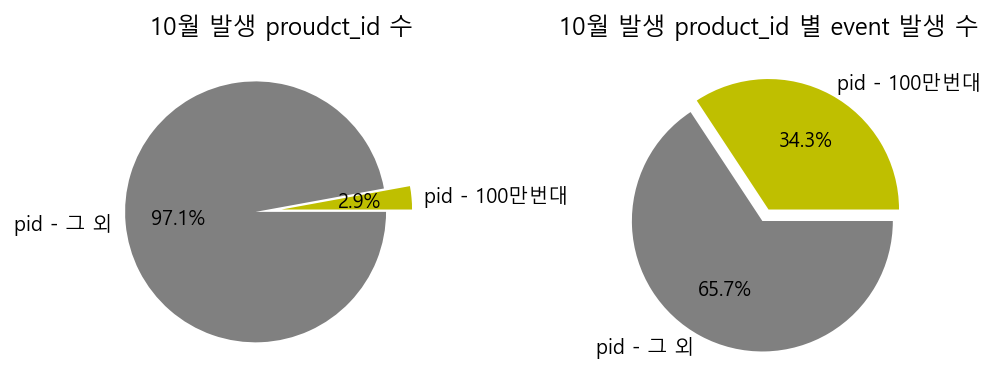

In [28]:
# pid 시각화
fig, ax = plt.subplots(1,2, figsize=(8,3))

# 100만번대 produc id 추출 조건
condition = (df_19_oct['product_id']<2000000) & (df_19_oct['product_id']>=1000000)

# 100만번대 pid 개수
n_pid_1M = df_19_oct[condition]['product_id'].nunique() 
# 그 외 pid 개수 = 전체 pid개수 - 100만번대 pid 개수
n_pid_etc = df_19_oct['product_id'].nunique() - n_pid_1M 

ax[0].pie(x=pd.Series([n_pid_1M, n_pid_etc]), 
          labels=['pid - 100만번대','pid - 그 외'], 
          autopct='%.1f%%', explode=[0,0.2], 
          colors = ['y','gray'])
ax[0].title.set_text('10월 발생 proudct_id 수')

df_19_oct['1M_yn'] = condition # 100만번대 여부 컬럼 생성
grouped = df_19_oct.value_counts('1M_yn').sort_values()

ax[1].pie(x=grouped.values, labels=['pid - 100만번대','pid - 그 외'], 
          autopct='%.1f%%', explode=[0,0.1],
          colors = ['y','gray'])
ax[1].title.set_text('10월 발생 product_id 별 event 발생 수')

# plt.tight_layout()
# plt.show()

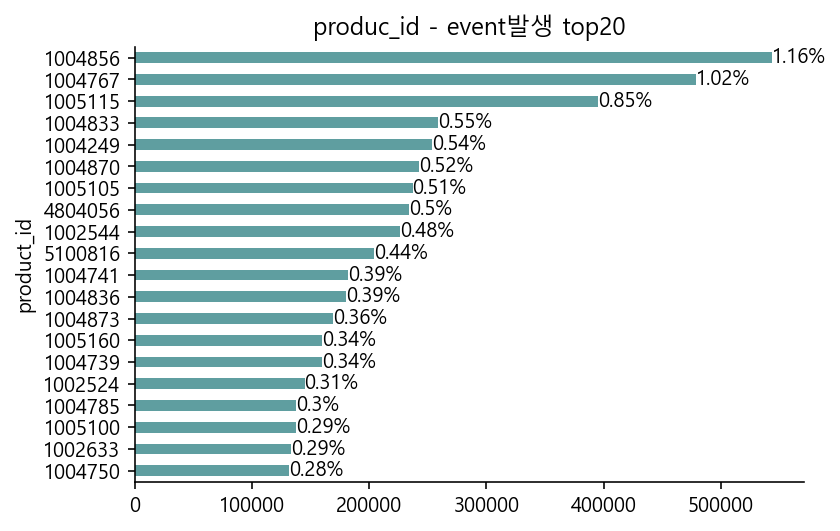

In [29]:
# event 상위 20개

grouped = df_19_oct.value_counts('product_id', sort=True).head(20).sort_values()

g =grouped.plot(kind='barh', color = '#5F9EA0')

# 수치 기입
for bar, val in zip(g.patches, grouped.values):
    g.annotate(f'{round(val/len(df_19_oct)*100,2)}%', (val, bar.get_y()))

    plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)

plt.title('produc_id - event발생 top20')
plt.show()

- event 1개인 product id 수 -> 10957개
    - event가 1개만 있는 경울 인사이트를 얻어내기 힘들어 보인다. 
    - 하위는 의미 없어서 생략

In [30]:
tmp = df_19_oct.value_counts('product_id').reset_index().rename(columns={0:'counts'})
condition = tmp['counts']<= 1
filtered = tmp[condition]
pid_under_1 = filtered['product_id']

val = len(df_19_oct[df_19_oct['product_id'].isin(pid_under_1)])

print('product_id 길이 -> event 1개만 있는 경우 :',val, 'rows')

product_id 길이 -> event 1개만 있는 경우 : 10957 rows


---

### `category_code`

- unknown(미등록) 인 경우가 가장 많고
- 미동록을 제외하면 electronics.smartphone 이 독보적으로 높다.

In [31]:
df_19_oct.value_counts('category_code', sort=True)

category_code
unknown                         14886279
electronics.smartphone          12626373
electronics.clocks               1438553
computers.notebook               1260341
electronics.video.tv             1245311
                                  ...   
construction.tools.soldering         829
apparel.shorts                       670
auto.accessories.anti_freeze         565
apparel.jacket                       436
country_yard.furniture.bench         190
Length: 127, dtype: int64

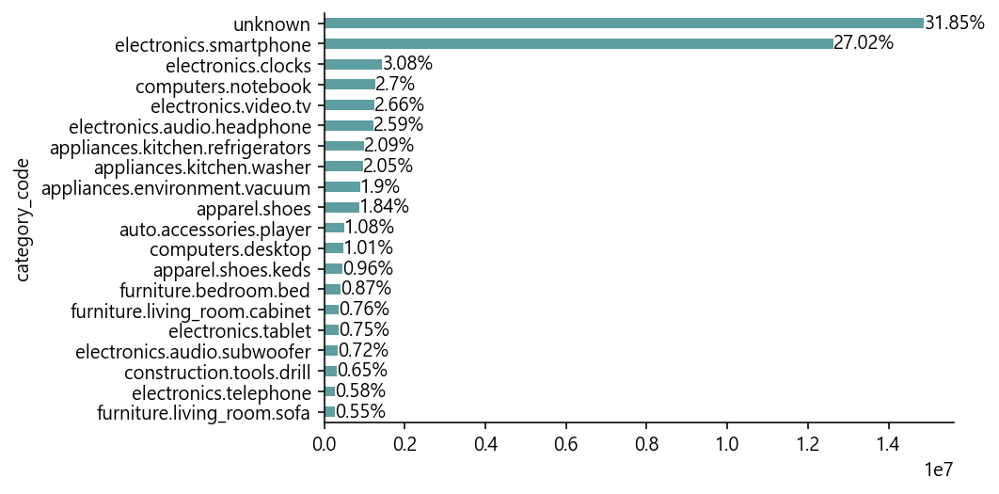

In [32]:
# 카테코리 전체 분류 기준
grouped = df_19_oct.value_counts('category_code', sort=True).nlargest(20).sort_values(ascending=True)
g = grouped.plot(kind='barh', color = '#5F9EA0')

    
for bar, val in zip(g.patches,grouped.values):
    g.annotate(f'{round(val/len(df_19_oct)*100,2)}%', (val, bar.get_y()))
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.show()

- 대분류 기준 (unknown 제외)
    - 전자기기 -> 가전제품 -> 컴퓨터 -> 의류 -> 가구 순

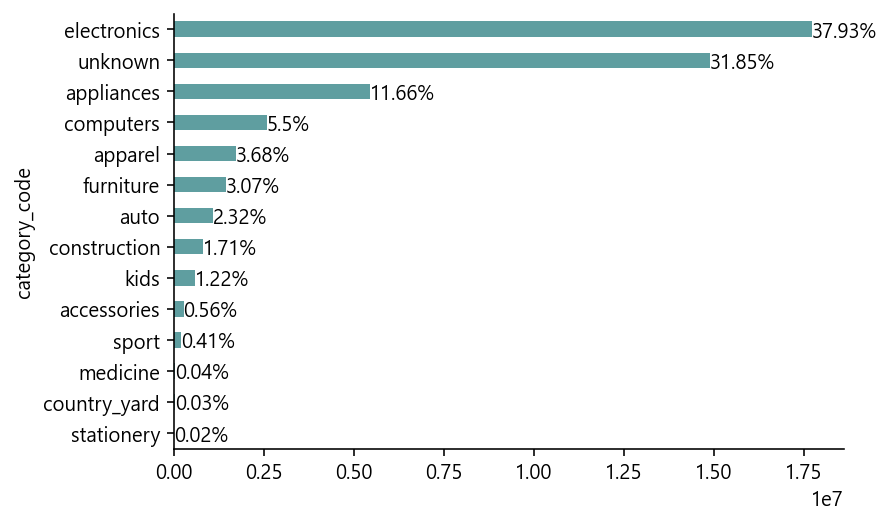

In [33]:
# 카테고리 대분류 기준
cond = df_19_oct['category_code'].apply(lambda x:x.split('.')[0]) # 대분류 필터링
grouped = df_19_oct.value_counts(cond, sort=True).nlargest(20).sort_values() 

g = grouped.plot(kind='barh', color = '#5F9EA0') 
    
for bar, val in zip(g.patches,grouped.values):
    g.annotate(f'{round(val/len(df_19_oct)*100,2)}%', (val, bar.get_y()))
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.show()

### `brand`
- 삼성 -> 애플 -> 샤오미 -> 화웨이 순
- 상위 4개가 휴대폰 제조사
- 삼성은 가전 포함
- lucente -> 카자흐스탄 악세사리 브랜드로 추정 -> category_code 전부 unknown

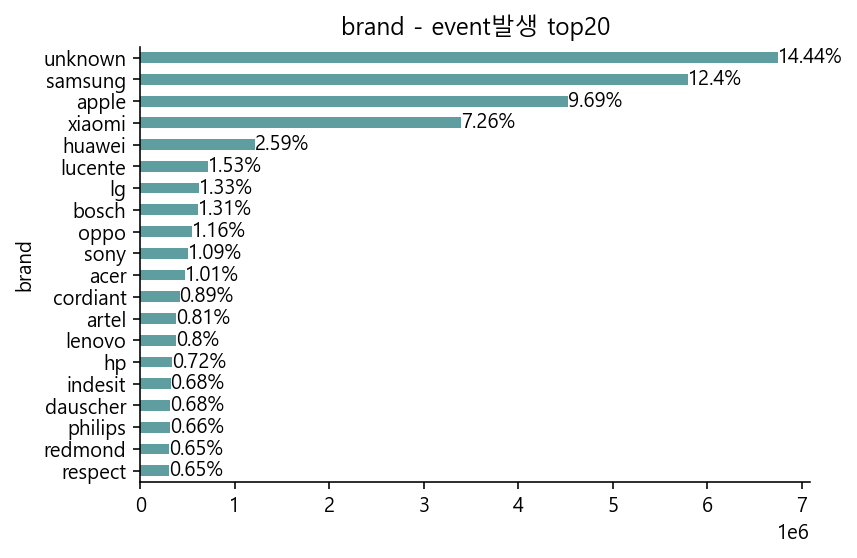

In [34]:
# event 상위 20개

grouped = df_19_oct.value_counts('brand', sort=True).head(20).sort_values()

g =grouped.plot(kind='barh', color = '#5F9EA0')

# 수치 기입
for bar, val in zip(g.patches, grouped.values):
    g.annotate(f'{round(val/len(df_19_oct)*100,2)}%', (val, bar.get_y()))

    plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)

plt.title('brand - event발생 top20')
plt.show()

### `price`

- right-skewed
    - 가격이 왼쪽으로 치우침

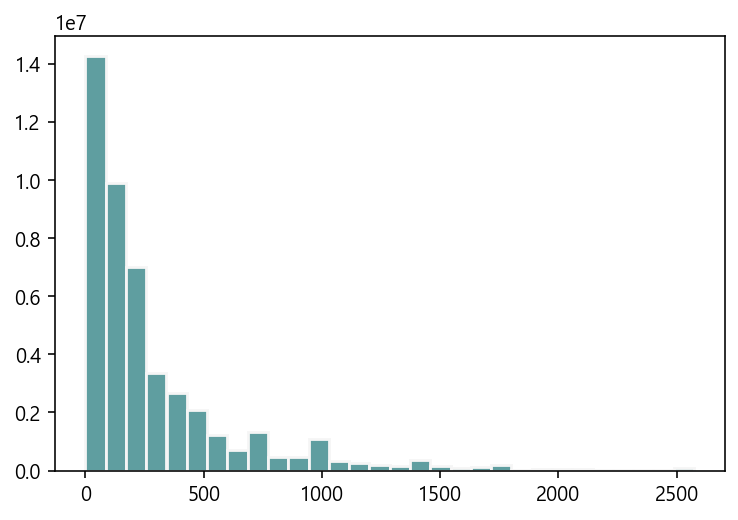

In [35]:
# 가격대
plt.hist(df_19_oct['price'], bins = 30, 
         edgecolor = 'whitesmoke', linewidth = 1.4, 
         color = '#5F9EA0')
plt.show()

- 가격이 0인 데이터 존재함

In [36]:
pd.DataFrame(df_19_oct['price'].agg(['min','max','mean','median'])).T

,min,max,mean,median
price,0.0,2574.070068,238.851944,164.710007


In [37]:
df_19_oct[df_19_oct['price']==0].head()

,event_time,event_type,product_id,category_code,brand,price,user_id,user_session,1M_yn
2259,2019-10-01 08:21:36+06:00,view,53000001,unknown,unknown,0.0,512450748,03267357-d0e5-4831-acee-6554cba7c0b1,False
2312,2019-10-01 08:21:44+06:00,view,53000001,unknown,unknown,0.0,512450748,03267357-d0e5-4831-acee-6554cba7c0b1,False
2600,2019-10-01 08:22:31+06:00,view,7000684,kids.carriage,unknown,0.0,555462472,c378efe2-75b4-48fa-96ec-bce2ab05d7fc,False
3367,2019-10-01 08:24:38+06:00,view,4100157,unknown,unknown,0.0,531057348,6b9c87ab-f991-45ce-98d2-f5ef05e0b2a4,False
4938,2019-10-01 08:28:07+06:00,view,23301316,unknown,unknown,0.0,521311516,f3a2fd03-13eb-4235-96bd-15329b8db1b8,False


In [38]:
# 가격이 0인 데이터의 비율
print('가격이 0인 데이터의 비율 :')
print(round(np.mean(df_19_oct['price']==0),4) * 100 ,'%')

가격이 0인 데이터의 비율 :
0.15 %


- 가격이 0인 데이터 제거

In [39]:
df_19_oct = df_19_oct.drop(df_19_oct[df_19_oct['price']==0].index, axis=0).reset_index(drop=True)

In [40]:
df_19_oct['price'].agg(['min','max','mean','median'])

min          0.770000
max       2574.070068
mean       239.217239
median     164.929993
Name: price, dtype: float64

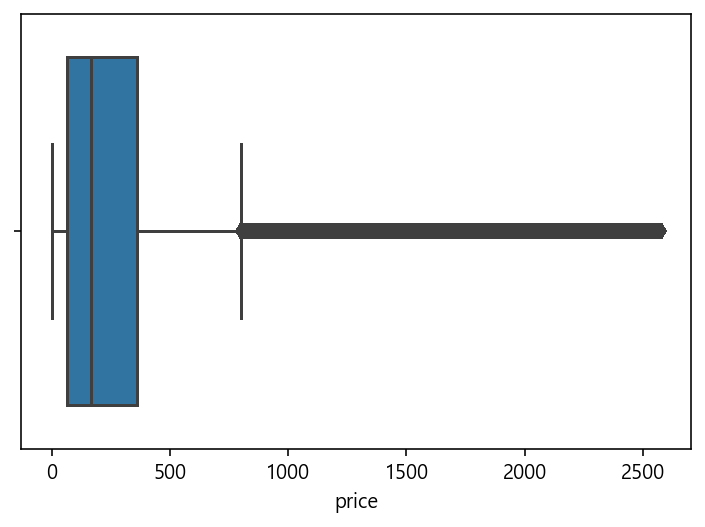

In [41]:
sns.boxplot(x='price', data=df_19_oct)
plt.show()

### `user_id`

In [42]:
pd.DataFrame(df_19_oct['user_id'].describe()).T

,count,mean,std,min,25%,50%,75%,max
user_id,46663894.0,5.337048e+08,1.869866e+07,33869381.0,515911907.0,529780514.0,551763997.0,567211839.0


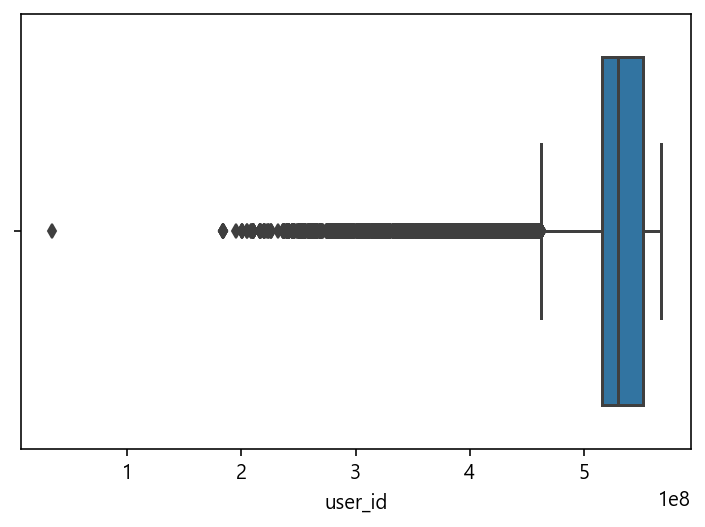

In [43]:
sns.boxplot(x='user_id', data=df_19_oct);

- 유일하게 3천만번대의 user_id를 가지는 case가 하나 있다.
    - case도 1가지밖에 없고 단순 view 데이터 이기 때문에 제거해도 무방할 것 같다.

In [44]:
df_19_oct['user_id'].sort_values()

31887245     33869381
2414989     183503497
4790610     184265397
4789633     184265397
4798355     184265397
              ...    
46663074    567211736
46663234    567211758
46663078    567211758
46663670    567211839
46663833    567211839
Name: user_id, Length: 46663894, dtype: int32

In [45]:
df_19_oct[df_19_oct['user_id']==33869381]

,event_time,event_type,product_id,category_code,brand,price,user_id,user_session,1M_yn
31887245,2019-10-24 02:04:08+06:00,view,7002639,kids.carriage,bumbleride,769.650024,33869381,d83dc524-8a2c-4780-bbe0-f8aee03b54df,False


In [46]:
# 해당 row 제거
df_19_oct = df_19_oct.drop(31887245)

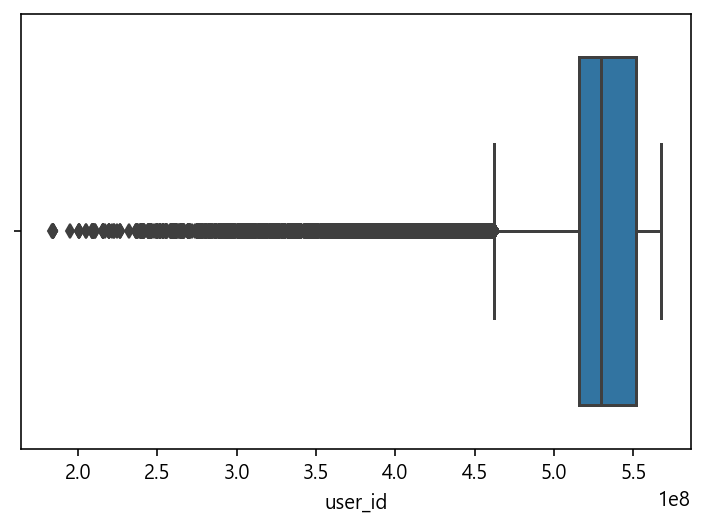

In [47]:
sns.boxplot(x='user_id', data=df_19_oct);

In [48]:
print('10월 총 방문자 수 :')
print(df_19_oct['user_id'].nunique(),'명')

10월 총 방문자 수 :
3223906 명


### `user_session`

In [49]:
print('10월 총 session 수:')
df_19_oct['user_session'].nunique()

10월 총 session 수:


10190988

In [50]:
# session별 유지시간
df_user_session = df_19_oct.groupby('user_session')['event_time'].agg(['min','max'])
df_user_session['duration'] = df_user_session['max'] - df_user_session['min']
df_user_session.sort_values('duration')

,min,max,duration
user_session,,,
b7178847-b1da-4ceb-84c1-85b2a5b6248f,2019-10-20 15:14:06+06:00,2019-10-20 15:14:06+06:00,0 days 00:00:00
a396690a-026f-40b5-9fcb-ca79d1a34ed9,2019-10-27 10:03:58+06:00,2019-10-27 10:03:58+06:00,0 days 00:00:00
a396643c-92ab-49d6-b647-5afadd0f4138,2019-10-05 19:15:42+06:00,2019-10-05 19:15:42+06:00,0 days 00:00:00
a3966359-7dee-47ae-8154-c5ebb470a249,2019-10-18 13:15:00+06:00,2019-10-18 13:15:00+06:00,0 days 00:00:00
45c9259c-0648-4ca0-9d33-d5efdabc0b8d,2019-10-19 00:14:29+06:00,2019-10-19 00:14:29+06:00,0 days 00:00:00
...,...,...,...
2e939356-e684-4cb0-8b2a-486fc204117f,2019-10-01 21:55:01+06:00,2019-11-03 22:17:27+06:00,33 days 00:22:26
e5f334e3-e895-4d03-a8fa-b52d7005ee93,2019-10-01 10:03:32+06:00,2019-11-03 12:50:29+06:00,33 days 02:46:57
906d839b-760b-4565-a985-f0290f97a818,2019-10-01 09:55:25+06:00,2019-11-03 15:23:02+06:00,33 days 05:27:37


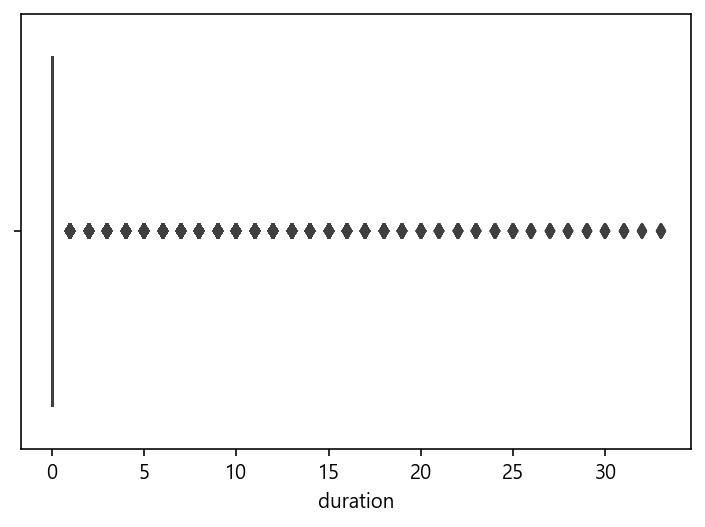

In [53]:
# user_session duration이 1일 이상 되는경우는 이상치에 해당하는데
sns.boxplot(df_user_session['duration'].dt.days);

In [55]:
# 세션 유지길이 분포의 Q1, Q3 확인했으나 둘다 0 (하루 내)로 
# 세션 길이가 1일 이상부터는 이상치로 본다.
Q1 = df_user_session['duration'].dt.days.quantile(0.25)
Q3 = df_user_session['duration'].dt.days.quantile(0.75)
print(Q1,Q3)

0.0 0.0


In [56]:
df_user_session['duration'].describe()

count                     10190988
mean     0 days 00:17:35.490685692
std      0 days 06:32:30.976772153
min                0 days 00:00:00
25%                0 days 00:00:00
50%                0 days 00:01:03
75%                0 days 00:04:29
max               33 days 14:34:36
Name: duration, dtype: object

- 정상범위 (세션 길이 1일 이내)

In [58]:
# duration 기준 segmentation
cond = df_user_session['duration'].dt.days == 0
a = set(df_user_session[cond].index) # 정상범위
b = set(df_user_session[~cond].index) # 이상치

In [64]:
cond = df_19_oct['event_time'].dt.week > 40
df = df_19_oct[cond]

In [65]:
# 정상범위 총 매출 및 평단가
c1 = df['user_session'].isin(a)
c2 = df['event_type'] == 'purchase'
print(df[c1 & c2]['price'].sum())
print(df[c1 & c2]['price'].sum() / len(df[c1 & c2]['price']))

208084260.0
307.1984599054271


In [66]:
c1 = df['user_session'].isin(a)
c2 = df['event_type'] == 'purchase'
df[c1&c2].value_counts('category_code', normalize=True).head(10)

category_code
electronics.smartphone              0.452999
unknown                             0.238814
electronics.audio.headphone         0.040461
electronics.video.tv                0.028920
electronics.clocks                  0.023738
appliances.kitchen.washer           0.021351
computers.notebook                  0.020172
appliances.environment.vacuum       0.016449
appliances.kitchen.refrigerators    0.015082
electronics.tablet                  0.007466
dtype: float64

In [67]:
c1 = df['user_session'].isin(a)
df[c1].value_counts('category_code', normalize=True).head(10)

category_code
unknown                             0.319605
electronics.smartphone              0.268265
electronics.clocks                  0.030040
electronics.video.tv                0.027220
computers.notebook                  0.026361
electronics.audio.headphone         0.025681
appliances.kitchen.refrigerators    0.020992
appliances.kitchen.washer           0.020399
apparel.shoes                       0.019714
appliances.environment.vacuum       0.018927
dtype: float64

In [68]:
c1 = df['user_session'].isin(a)
df[c1].value_counts('event_type', normalize=True)

event_type
view        0.962390
cart        0.020294
purchase    0.017316
dtype: float64

- 이상치 (세션 길이 1일 이상)

In [69]:
# 이상치 총 매출 및 평단가
c1 = df['user_session'].isin(b)
c2 = df['event_type'] == 'purchase'
print(df[c1 & c2]['price'].sum())
print(df[c1 & c2]['price'].sum() / len(df[c1 & c2]['price']))

136999.56
357.70120757180155


In [70]:
c1 = df['user_session'].isin(b)
df[c1].value_counts('category_code', normalize=True).head(10)

category_code
electronics.smartphone              0.374969
unknown                             0.280265
electronics.clocks                  0.043027
electronics.audio.headphone         0.041121
computers.notebook                  0.032506
appliances.kitchen.washer           0.017950
appliances.kitchen.refrigerators    0.016358
computers.desktop                   0.016230
electronics.video.tv                0.014277
electronics.tablet                  0.009731
dtype: float64

In [71]:
c1 = df['user_session'].isin(b)
c2 = df['event_type'] == 'purchase'
df[c1&c2].value_counts('category_code', normalize=True).head(10)

category_code
electronics.smartphone              0.579634
unknown                             0.130548
computers.notebook                  0.065274
appliances.kitchen.refrigerators    0.060052
appliances.kitchen.washer           0.049608
electronics.video.tv                0.036554
electronics.camera.video            0.013055
appliances.environment.vacuum       0.013055
computers.desktop                   0.007833
electronics.audio.headphone         0.007833
dtype: float64

In [72]:
c1 = df['user_session'].isin(b)
df[c1].value_counts('event_type', normalize=True)

event_type
view        0.990304
cart        0.005243
purchase    0.004453
dtype: float64

In [73]:
# 정상범위 대비 이상치 총매출 비율
print(round((136999.56/208084260) * 100, 3), '%')

0.066 %


- user_session이 가장 긴 경우 탐색
    - 10/1, 2, 15, 18, 21, 22, 23, 11/1, 11/3
    - 똑같은 상품을 계속해서 view만 하는데 어떤 경우? 
    - 첫번째의 경우, product_id, 가격까지 똑같고 
    - 두번째,세번째의 경우, product_id는 같으나 가격의 변동이 조금씩 있다.
    - session이 계속 유지되는 이유는 파악이 필요하다. 

In [74]:
# session 길이가 가장 긴 경우
# 똑같은 제품을 한달 내내 view만 생성
a = df_19_oct[df_19_oct['user_session'] == '83085f41-22c3-4f27-bc29-bfaaf460d902']
a.style.background_gradient(axis=0, gmap=a['price'], cmap='RdYlGn_r', subset=['price'])

,event_time,event_type,product_id,category_code,brand,price,user_id,user_session,1M_yn
3825,2019-10-01 08:25:40+06:00,view,1307116,computers.notebook,hp,463.070007,548049635,83085f41-22c3-4f27-bc29-bfaaf460d902,True
596390,2019-10-01 17:52:34+06:00,view,1307116,computers.notebook,hp,463.070007,548049635,83085f41-22c3-4f27-bc29-bfaaf460d902,True
596440,2019-10-01 17:52:37+06:00,view,1307116,computers.notebook,hp,463.070007,548049635,83085f41-22c3-4f27-bc29-bfaaf460d902,True
596457,2019-10-01 17:52:38+06:00,view,1307116,computers.notebook,hp,463.070007,548049635,83085f41-22c3-4f27-bc29-bfaaf460d902,True
1820554,2019-10-02 17:24:56+06:00,view,1307116,computers.notebook,hp,463.070007,548049635,83085f41-22c3-4f27-bc29-bfaaf460d902,True
1820569,2019-10-02 17:24:57+06:00,view,1307116,computers.notebook,hp,463.070007,548049635,83085f41-22c3-4f27-bc29-bfaaf460d902,True
19055878,2019-10-15 11:15:01+06:00,view,1307116,computers.notebook,hp,463.070007,548049635,83085f41-22c3-4f27-bc29-bfaaf460d902,True
19055923,2019-10-15 11:15:03+06:00,view,1307116,computers.notebook,hp,463.070007,548049635,83085f41-22c3-4f27-bc29-bfaaf460d902,True
23804423,2019-10-18 15:06:17+06:00,view,1307116,computers.notebook,hp,463.070007,548049635,83085f41-22c3-4f27-bc29-bfaaf460d902,True
23804453,2019-10-18 15:06:18+06:00,view,1307116,computers.notebook,hp,463.070007,548049635,83085f41-22c3-4f27-bc29-bfaaf460d902,True


In [75]:
# session 길이가 두번째로 긴 경우
# view만 존재 가격변동 발생
b = df_19_oct[df_19_oct['user_session'] == '18e33676-8d30-48e9-9142-d7cb1a4da86e']
b.style.background_gradient(axis=0, gmap=b['price'], cmap='RdYlGn_r', subset=['price'] )

,event_time,event_type,product_id,category_code,brand,price,user_id,user_session,1M_yn
1069,2019-10-01 06:51:21+06:00,view,1004858,electronics.smartphone,samsung,134.419998,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e,True
2998644,2019-10-03 18:17:49+06:00,view,1004858,electronics.smartphone,samsung,132.020004,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e,True
6793833,2019-10-06 15:32:59+06:00,view,1004858,electronics.smartphone,samsung,131.759995,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e,True
8218655,2019-10-07 18:03:31+06:00,view,1004858,electronics.smartphone,samsung,131.759995,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e,True
11476440,2019-10-10 02:18:21+06:00,view,1004858,electronics.smartphone,samsung,131.740005,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e,True
12664732,2019-10-11 00:27:38+06:00,view,1004858,electronics.smartphone,samsung,131.649994,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e,True
12749121,2019-10-11 02:13:04+06:00,view,1004858,electronics.smartphone,samsung,131.639999,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e,True
15320695,2019-10-12 21:15:35+06:00,view,1004858,electronics.smartphone,samsung,131.610001,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e,True
15326698,2019-10-12 21:19:22+06:00,view,1004858,electronics.smartphone,samsung,131.610001,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e,True
15730509,2019-10-13 02:55:49+06:00,view,1004858,electronics.smartphone,samsung,131.630005,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e,True


In [76]:
df_19_nov[df_19_nov['user_session'] == '18e33676-8d30-48e9-9142-d7cb1a4da86e']

,event_time,event_type,product_id,category_code,brand,price,user_id,user_session
2178762,2019-11-02 17:45:25+06:00,view,1004858,electronics.smartphone,samsung,127.919998,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e
4085058,2019-11-03 21:02:56+06:00,view,1004858,electronics.smartphone,samsung,127.930000,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e
10121083,2019-11-07 12:39:36+06:00,view,1004858,electronics.smartphone,samsung,131.660004,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e
14336235,2019-11-09 17:39:57+06:00,view,1004858,electronics.smartphone,samsung,127.720001,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e
16977495,2019-11-10 23:35:43+06:00,view,1004858,electronics.smartphone,samsung,127.449997,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e
17270694,2019-11-11 05:48:11+06:00,view,1004858,electronics.smartphone,samsung,127.430000,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e
20219406,2019-11-12 17:51:30+06:00,view,1004858,electronics.smartphone,samsung,127.150002,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e
50476311,2019-11-20 22:23:26+06:00,view,1004858,electronics.smartphone,samsung,126.860001,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e
50825063,2019-11-21 02:59:22+06:00,view,1004858,electronics.smartphone,samsung,126.860001,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e
52094099,2019-11-21 21:47:10+06:00,view,1004858,electronics.smartphone,samsung,126.820000,548253067,18e33676-8d30-48e9-9142-d7cb1a4da86e


In [77]:
# session 길이가 세번째로 긴 경우
# 마찬가지로 view만 존재 가격변동 발생
c = df_19_oct[df_19_oct['user_session'] == '906d839b-760b-4565-a985-f0290f97a818']
c.style.background_gradient(axis=0, gmap=c['price'], cmap='RdYlGn_r', subset=['price'])

,event_time,event_type,product_id,category_code,brand,price,user_id,user_session,1M_yn
69109,2019-10-01 09:55:25+06:00,view,1004741,electronics.smartphone,xiaomi,185.710007,549783344,906d839b-760b-4565-a985-f0290f97a818,True
5764830,2019-10-05 19:43:41+06:00,view,1004741,electronics.smartphone,xiaomi,185.820007,549783344,906d839b-760b-4565-a985-f0290f97a818,True
8370720,2019-10-07 20:28:48+06:00,view,1004741,electronics.smartphone,xiaomi,190.970001,549783344,906d839b-760b-4565-a985-f0290f97a818,True
14396242,2019-10-12 09:37:58+06:00,view,1004741,electronics.smartphone,xiaomi,197.119995,549783344,906d839b-760b-4565-a985-f0290f97a818,True
16207722,2019-10-13 13:55:33+06:00,view,1004741,electronics.smartphone,xiaomi,194.330002,549783344,906d839b-760b-4565-a985-f0290f97a818,True
30593385,2019-10-23 08:13:50+06:00,view,1004741,electronics.smartphone,xiaomi,189.970001,549783344,906d839b-760b-4565-a985-f0290f97a818,True
36190614,2019-10-27 10:56:25+06:00,view,1004741,electronics.smartphone,xiaomi,189.970001,549783344,906d839b-760b-4565-a985-f0290f97a818,True
39408901,2019-10-29 20:12:57+06:00,view,1004741,electronics.smartphone,xiaomi,189.970001,549783344,906d839b-760b-4565-a985-f0290f97a818,True
40502039,2019-10-30 18:19:50+06:00,view,1004741,electronics.smartphone,xiaomi,189.970001,549783344,906d839b-760b-4565-a985-f0290f97a818,True
43921174,2019-11-02 10:09:05+06:00,view,1004741,electronics.smartphone,xiaomi,189.970001,549783344,906d839b-760b-4565-a985-f0290f97a818,True


-  일별-세션 으로 그룹화
    - 이상치 제거하기보단 일별로 session을 끊어줬더니 이상치가 사라졌다.
    - 데이터 손실 막았다.

In [78]:
day_of_year = df_19_oct['event_time'].dt.dayofyear
df_user_session = df_19_oct.groupby([day_of_year, 'user_session'])['event_time'].agg(['min','max'])
df_user_session['duration'] = df_user_session['max'] - df_user_session['min']
df_user_session.head()

min  \
event_time user_session                                                     
274        00012d23-c857-40af-b8cb-ada787bc00cc 2019-10-01 21:49:07+06:00   
           00016bb9-b50d-4bcb-95d1-9c375f214c66 2019-10-01 15:51:44+06:00   
           0001d713-f9c4-4d96-8f8c-5da2bff7bbf9 2019-10-01 16:09:56+06:00   
           000242ef-7e45-454c-a94c-6c1fd351a974 2019-10-01 18:07:18+06:00   
           0002c5ea-3509-4d0b-9618-7e40925005f0 2019-10-01 12:07:00+06:00   

                                                                      max  \
event_time user_session                                                     
274        00012d23-c857-40af-b8cb-ada787bc00cc 2019-10-01 21:49:51+06:00   
           00016bb9-b50d-4bcb-95d1-9c375f214c66 2019-10-01 15:52:14+06:00   
           0001d713-f9c4-4d96-8f8c-5da2bff7bbf9 2019-10-01 16:18:52+06:00   
           000242ef-7e45-454c-a94c-6c1fd351a974 2019-10-01 18:07:18+06:00   
           0002c5ea-3509-4d0b-9618-7e40925005f0 2019-10-01 12:10:46+06:00   

                                                       duration  
event_time user_session                                          
274        00012d23-c857-40af-b8cb-ada787bc00cc 0 days 00:00:44  
           00016bb9-b50d-4bcb-95d1-9c375f214c66 0 days 00:00:30  
           0001d713-f9c4-4d96-8f8c-5da2bff7bbf9 0 days 00:08:56  
           000242ef-7e45-454c-a94c-6c1fd351a974 0 days 00:00:00  
           0002c5ea-3509-4d0b-9618-7e40925005f0 0 days 00:03:46

In [79]:
df_user_session.tail()

min  \
event_time user_session                                                     
307        ffff31ba-750c-4dc0-8522-2f9c2f401ac9 2019-11-03 23:57:44+06:00   
           ffff4aec-a881-462a-b5c2-c9b0b7604a66 2019-11-03 20:56:18+06:00   
           ffff5bfd-9602-4315-80a8-e18a9af986cd 2019-11-03 08:50:26+06:00   
           fffff237-cd54-46c2-bc94-0fea54d6b0b4 2019-11-03 10:07:55+06:00   
           fffff7e1-9294-4d6c-8482-e1438ba88380 2019-11-03 10:21:13+06:00   

                                                                      max  \
event_time user_session                                                     
307        ffff31ba-750c-4dc0-8522-2f9c2f401ac9 2019-11-03 23:57:44+06:00   
           ffff4aec-a881-462a-b5c2-c9b0b7604a66 2019-11-03 21:13:41+06:00   
           ffff5bfd-9602-4315-80a8-e18a9af986cd 2019-11-03 08:52:07+06:00   
           fffff237-cd54-46c2-bc94-0fea54d6b0b4 2019-11-03 10:15:03+06:00   
           fffff7e1-9294-4d6c-8482-e1438ba88380 2019-11-03 10:25:17+06:00   

                                                       duration  
event_time user_session                                          
307        ffff31ba-750c-4dc0-8522-2f9c2f401ac9 0 days 00:00:00  
           ffff4aec-a881-462a-b5c2-c9b0b7604a66 0 days 00:17:23  
           ffff5bfd-9602-4315-80a8-e18a9af986cd 0 days 00:01:41  
           fffff237-cd54-46c2-bc94-0fea54d6b0b4 0 days 00:07:08  
           fffff7e1-9294-4d6c-8482-e1438ba88380 0 days 00:04:04

In [80]:
(df_user_session['duration'].dt.total_seconds()//60).describe()

count    1.027320e+07
mean     5.309861e+00
std      2.741016e+01
min      0.000000e+00
25%      0.000000e+00
50%      1.000000e+00
75%      4.000000e+00
max      1.435000e+03
Name: duration, dtype: float64

In [81]:
a = df_19_oct[df_19_oct['user_session'] == 'c04b7407-6b58-4508-8691-35c44796247e']
cm = sns.light_palette("green", as_cmap=True)
b = a.style.background_gradient(cmap=cm)
b

,event_time,event_type,product_id,category_code,brand,price,user_id,user_session,1M_yn
3415246,2019-10-04 00:06:13+06:00,view,1004767,electronics.smartphone,samsung,252.880005,538076307,c04b7407-6b58-4508-8691-35c44796247e,True
4801901,2019-10-04 23:53:35+06:00,view,1004529,electronics.smartphone,samsung,396.149994,538076307,c04b7407-6b58-4508-8691-35c44796247e,True
4804868,2019-10-04 23:55:49+06:00,view,1005006,electronics.smartphone,xiaomi,89.320000,538076307,c04b7407-6b58-4508-8691-35c44796247e,True
4806261,2019-10-04 23:56:52+06:00,view,1005150,electronics.smartphone,xiaomi,569.710022,538076307,c04b7407-6b58-4508-8691-35c44796247e,True
4806486,2019-10-04 23:57:01+06:00,view,1005149,electronics.smartphone,xiaomi,483.899994,538076307,c04b7407-6b58-4508-8691-35c44796247e,True


In [82]:
# session 길이가 가장 긴 경우
a = df_19_oct[df_19_oct['user_session'] == 'f6f56e66-fb30-4a95-9436-608783af860d']
a.style.background_gradient(axis=0, gmap=a['price'], cmap='RdYlGn_r', subset=['price'])

,event_time,event_type,product_id,category_code,brand,price,user_id,user_session,1M_yn
4813044,2019-10-05 00:02:08+06:00,view,27400001,unknown,oral-b,17.990000,556596480,f6f56e66-fb30-4a95-9436-608783af860d,False
4815020,2019-10-05 00:03:40+06:00,view,27400001,unknown,oral-b,17.990000,556596480,f6f56e66-fb30-4a95-9436-608783af860d,False
6122160,2019-10-05 23:57:32+06:00,view,27400001,unknown,oral-b,17.990000,556596480,f6f56e66-fb30-4a95-9436-608783af860d,False
6378687,2019-10-06 09:31:31+06:00,view,27400001,unknown,oral-b,17.990000,556596480,f6f56e66-fb30-4a95-9436-608783af860d,False


In [83]:
# session 길이가 두번째로 긴 경우
a = df_19_oct[df_19_oct['user_session'] == 'c04b7407-6b58-4508-8691-35c44796247e']
a.style.background_gradient(axis=0, gmap=a['price'], cmap='RdYlGn_r', subset=['price'])

,event_time,event_type,product_id,category_code,brand,price,user_id,user_session,1M_yn
3415246,2019-10-04 00:06:13+06:00,view,1004767,electronics.smartphone,samsung,252.880005,538076307,c04b7407-6b58-4508-8691-35c44796247e,True
4801901,2019-10-04 23:53:35+06:00,view,1004529,electronics.smartphone,samsung,396.149994,538076307,c04b7407-6b58-4508-8691-35c44796247e,True
4804868,2019-10-04 23:55:49+06:00,view,1005006,electronics.smartphone,xiaomi,89.320000,538076307,c04b7407-6b58-4508-8691-35c44796247e,True
4806261,2019-10-04 23:56:52+06:00,view,1005150,electronics.smartphone,xiaomi,569.710022,538076307,c04b7407-6b58-4508-8691-35c44796247e,True
4806486,2019-10-04 23:57:01+06:00,view,1005149,electronics.smartphone,xiaomi,483.899994,538076307,c04b7407-6b58-4508-8691-35c44796247e,True


Hit, page view, event추적, 상거래 추적,사용자, 세션, 히트

In [84]:
df_19_oct.columns

Index(['event_time', 'event_type', 'product_id', 'category_code', 'brand',
       'price', 'user_id', 'user_session', '1M_yn'],
      dtype='object')

In [85]:
# event_type order 지정 
# view -> cart -> purchase
from pandas.api.types import CategoricalDtype
df_19_oct['event_type'] = df_19_oct['event_type'].astype(CategoricalDtype(categories=['view','cart','purchase'], ordered=True))

- cart의 통계치가 가장 높게 나오는이유?

In [86]:
df_19_oct.groupby('event_type')['price'].agg(['min','max','mean','median']).sort_index()

,min,max,mean,median
event_type,,,,
view,0.77,2574.070068,289.842438,162.139999
cart,1.00,2574.040039,335.263214,197.419998
purchase,0.77,2574.070068,308.719513,179.279999


## 컬럼간 확인

### `price` - `event_time` - `event_type`
- cart의 평균 금액이 가장 높은 이유? 

In [87]:
# 40주차 제거
cond = df_19_oct['event_time'].dt.week > 40
df = df_19_oct[cond]

#### 주차별

- 주차별 - event_type 별 평균 price
    1. cart : 월말에 금액이 급격히 높아진다.
    2. purchase : 42주차 count가 peak -> 평균 금액도 급상승 
    3. view : 42주차, 44주차(월말)이 높긴하지만 다른 event type에 비해 상이한편

In [88]:
# 주차별 평균 price
x1 = df['event_time'].dt.week
x2 = df['event_type']
grouped = df.groupby([x1,x2])['price'].agg(['mean','sum']).reset_index()
pv_mean = pd.pivot_table(grouped, index='event_type', 
                    columns='event_time', values='mean')
print('건당 평균 price')
display(pv_mean)

# 주차별 매출
cond = grouped['event_type'] == 'purchase'
grouped_pur = grouped[cond]
pv_sum = pd.pivot_table(grouped_pur, index='event_type', 
                    columns='event_time', values='sum')
print('주차별 매출')
display(pv_sum)

건당 평균 price


event_time,41,42,43,44
event_type,,,,
view,283.346069,291.029755,287.620087,291.120972
cart,329.240265,327.420837,328.101440,349.557373
purchase,293.522797,316.304596,308.605377,309.667328


주차별 매출


event_time,41,42,43,44
event_type,,,,
purchase,49766788.0,60204784.0,52295960.0,45953704.0


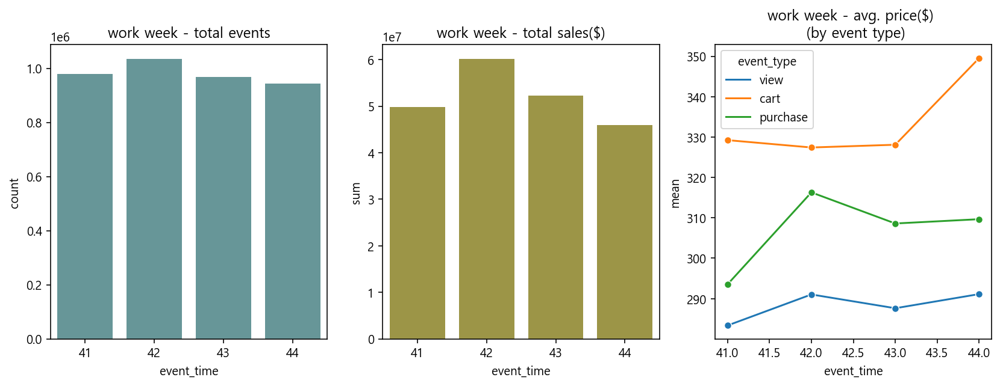

In [89]:
# 그래프
fig, ax = plt.subplots(1,3,figsize=(14,4.5))

color_1 = '#5F9EA0'
color_2 = '#AAA139'

# ax0
x = df_samp['event_time'].dt.week
g = sns.countplot(x = x, color=color_1, ax=ax[0])
g.title.set_text('work week - total events')

# ax1
y = 'sum'
x = 'event_time'
g = sns.barplot(y=y, x=x, data=grouped_pur,
                color=color_2, ax=ax[1])
g.title.set_text('work week - total sales($)')

# ax2
y='mean'
g = sns.lineplot(y=y, x=x, hue='event_type', 
                 data=grouped, marker='o', ax=ax[2])
g.title.set_text('work week - avg. price($) \n (by event type)')

plt.show()

#### 일별

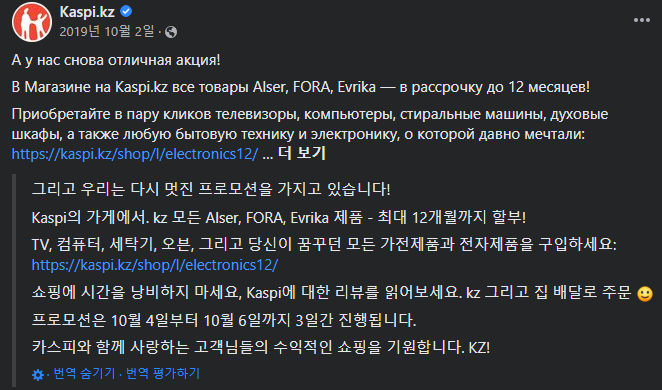

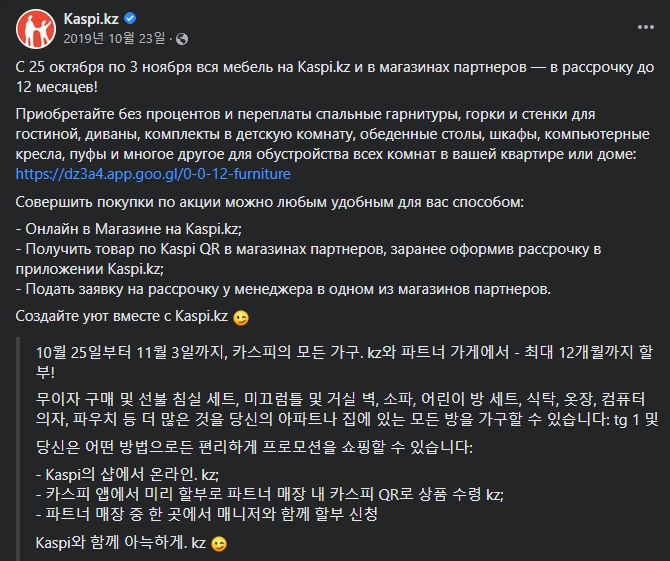

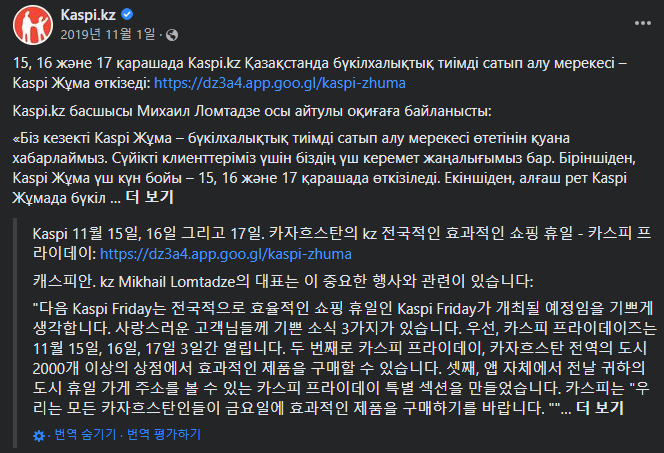

- 일별 평균 price
    1. cart는 월말에 peak
    2. 14일에 event가 진행된 것 같다(추정), 유일하게 구매의 평균금액이 cart평균금액을 뛰어넘었다. 
    3. 특이하게 count는 14일보다 13일이 더 높다. 14일에 이벤트 일어날줄알고 미리 많이 본건가?
    4. 11월 초에 구매가 급격히 떨어졌다.
- 일별 매출
    1.10월 13일과 

In [90]:
# 주차별 평균 price
x1 = df['event_time'].dt.dayofyear
x2 = df['event_type']
grouped = df.groupby([x1,x2])['price'].agg(['mean','sum']).reset_index()
pv_mean = pd.pivot_table(grouped, index='event_type', 
                    columns='event_time', values='mean')
pv_mean

event_time,280,281,282,283,284,285,286,287,288,289,...,298,299,300,301,302,303,304,305,306,307
event_type,,,,,,,,,,,,,,,,,,,,,
view,295.267883,278.954071,281.956329,289.122498,282.200653,282.093292,277.001495,298.016937,294.857941,290.925903,...,288.038177,288.364838,290.834930,289.691711,287.428162,287.552063,290.180573,293.080353,291.881561,296.228058
cart,339.450684,337.676514,343.481445,347.175018,330.699554,306.815125,306.803406,329.511993,333.770325,315.815002,...,328.119751,314.190979,323.180145,349.525269,339.665527,360.327545,364.295319,356.887451,336.335510,342.494385
purchase,298.056030,294.118195,302.170288,302.907593,294.739655,287.938690,279.790558,331.916718,327.863892,311.730682,...,305.180817,302.474457,306.509552,314.135956,315.245056,317.258301,321.305939,310.470612,293.650726,297.289948


In [91]:
# 주차별 매출
cond = grouped['event_type'] == 'purchase'
grouped_pur = grouped[cond]
pv_sum = pd.pivot_table(grouped_pur, index='event_type', 
                    columns='event_time', values='sum')
pv_sum

event_time,280,281,282,283,284,285,286,287,288,289,...,298,299,300,301,302,303,304,305,306,307
event_type,,,,,,,,,,,,,,,,,,,,,
purchase,6395686.5,6741483.0,6885554.5,6508272.5,7775232.5,7312779.0,8147780.5,9544265.0,8564461.0,9805800.0,...,7319151.5,6831688.0,7206652.5,6689839.5,6471666.0,6553605.0,6463390.5,6911076.0,6421260.5,6442868.0


In [92]:
import datetime as dt
date_labels = [dt.datetime.strptime(f'2019 {x}','%Y %j')
               .strftime('%m-%d') for x in pv_mean.columns]

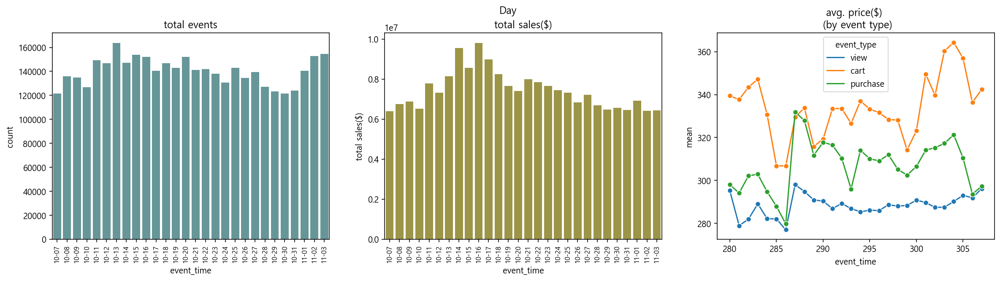

In [94]:
# 그래프
fig, ax = plt.subplots(1,3,figsize=(20,4.5))

# ax0
x = df_samp['event_time'].dt.dayofyear
g = sns.countplot(x = x, color=color_1, ax=ax[0])
g.set_xticklabels(date_labels,fontsize=8, rotation=90)
g.title.set_text('total events')


# ax1
y = 'sum'
x = 'event_time'
g = sns.barplot(y=y, x=x, data=grouped_pur,
                color=color_2, ax=ax[1])
g.set_xticklabels(date_labels,fontsize=8, rotation=90)
g.title.set_text('total sales($)')
ax[1].set(ylabel ='total sales($)')

# ax2
y='mean'
g = sns.lineplot(y=y, x=x, hue='event_type', 
                 data=grouped, marker='o', ax=ax[2])
g.title.set_text('avg. price($) \n (by event type)')
ax[1].set(ylabel ='total sales($)')  # line plot x-tick은 연속데이터그래프라 그런지 label 설정하는 방법이 다른것 같다
# g.set_xticklabels(g.get_xticklabels(),fontsize=8, rotation=90)
fig.suptitle('Day')

plt.show()

- 13일 -> 14일
    - view(87.84%)와 purchase(98.743%)는 낮아지고
    - cart는 급상승 (203.36%)
    - **cart는 늘었는데 구매횟수는 줄었다.**

In [98]:
cond = df['event_time'].dt.dayofyear == 286 # 10월 13일
df[cond].value_counts('event_type')

event_type
view        1585839
purchase      29121
cart          21772
dtype: int64

In [99]:
cond = df_19_oct['event_time'].dt.dayofyear == 287 # 10월 14일
df_19_oct[cond].value_counts('event_type')

event_type
view        1393029
cart          44276
purchase      28755
dtype: int64

#### 요일별

- 요일별 - event_type 별 평균 price
    1. cart의 경우 금요일에 금액이 peak
    2. 나머지는 월요일이나, 목요일이 peak
        - 월요일이나, 목요일이 peak인 이유?

In [100]:
# 평균 price
x1 = df['event_time'].dt.dayofweek
x2 = df['event_type']
grouped = df.groupby([x1,x2])['price'].agg(['mean','sum']).reset_index()
pv_mean = pd.pivot_table(grouped, index='event_type', 
                    columns='event_time', values='mean')
print('평균 price')
display(pv_mean)

# 매출
cond = grouped['event_type'] == 'purchase'
grouped_pur = grouped[cond]
pv_sum = pd.pivot_table(grouped_pur, index='event_type', 
                    columns='event_time', values='sum')
print('매출')
display(pv_sum)

평균 price


event_time,0,1,2,3,4,5,6
event_type,,,,,,,
view,292.098938,287.044403,286.695923,289.596680,287.466187,287.929993,287.498962
cart,336.392303,335.028046,331.518524,333.604065,335.013977,323.307831,324.454742
purchase,315.825989,312.243683,310.040710,313.665985,306.565125,298.582306,294.021667


매출


event_time,0,1,2,3,4,5,6
event_type,,,,,,,
purchase,30621226.0,29626616.0,30906718.0,29397402.0,30253074.0,28216028.0,29200174.0


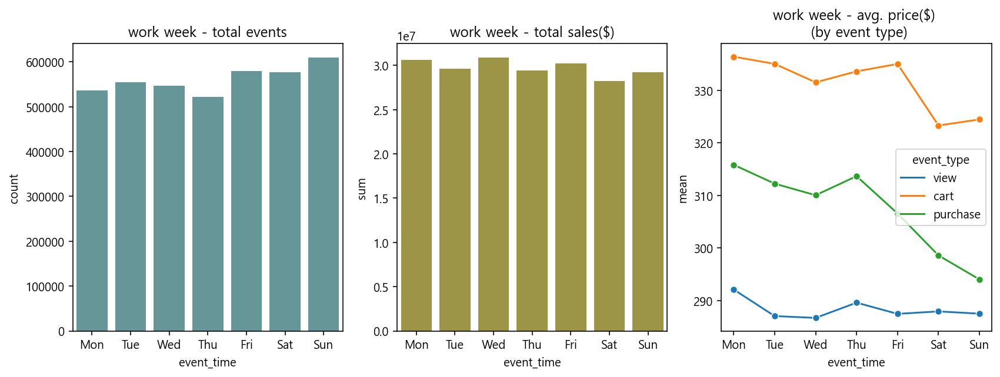

In [101]:
# 그래프
fig, ax = plt.subplots(1,3,figsize=(14,4.5))

color_1 = '#5F9EA0'
color_2 = '#AAA139'

# ax0
x = df_samp['event_time'].dt.dayofweek
g = sns.countplot(x = x, color=color_1, ax=ax[0])
g.title.set_text('work week - total events')
dow_label = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
g.set_xticklabels(dow_label)

# ax1
y = 'sum'
x = 'event_time'
g = sns.barplot(y=y, x=x, data=grouped_pur,
                color=color_2, ax=ax[1])
g.title.set_text('work week - total sales($)')
dow_label = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
g.set_xticklabels(dow_label)

# ax2
y='mean'
g = sns.lineplot(y=y, x=x, hue='event_type', 
                 data=grouped, marker='o', ax=ax[2])
g.title.set_text('work week - avg. price($) \n (by event type)')
dow_label = ['','Mon','Tue','Wed','Thu','Fri','Sat','Sun']
g.set_xticklabels(dow_label)

plt.show()

#### 시간별

1. 새벽시간대에 event수가 적은데, event별 평균단가는 다른 시간대에 비하여 높다.
2. 19시부터 22시까지 event수는 급상승 하는데, 같은시간대의 매출액은 감소한다.
3. 일과시간의 매출액이 가장 높다.

In [102]:
# 평균 price
x1 = df['event_time'].dt.hour
x2 = df['event_type']
grouped = df.groupby([x1,x2])['price'].agg(['mean','sum']).reset_index()
pv_mean = pd.pivot_table(grouped, index='event_type', 
                    columns='event_time', values='mean')
print('평균 price')
display(pv_mean)

# 매출
cond = grouped['event_type'] == 'purchase'
grouped_pur = grouped[cond]
pv_sum = pd.pivot_table(grouped_pur, index='event_type', 
                    columns='event_time', values='sum')
print('매출')
display(pv_sum)

평균 price


event_time,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
event_type,,,,,,,,,,,,,,,,,,,,,
view,295.393280,303.533722,311.325684,321.534729,316.954651,308.958160,288.715759,281.466309,277.263397,279.598206,...,285.303986,285.311005,285.430511,287.623322,290.024109,290.207977,289.011505,287.630737,287.563202,289.328217
cart,360.934448,372.632568,395.364929,404.673035,410.319366,379.268738,341.488983,316.341980,304.642059,310.790619,...,324.801788,337.976196,329.998566,336.862762,338.942902,329.748779,325.646973,322.265686,327.766632,336.172577
purchase,326.959686,340.993042,356.295105,375.953827,369.869812,356.647430,336.062012,283.510590,278.108154,292.066833,...,307.210144,314.549805,312.228149,316.481934,310.455109,311.600067,303.033997,293.139893,295.955963,300.417358


매출


event_time,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
event_type,,,,,,,,,,,,,,,,,,,,,
purchase,7289566.0,5227082.5,3249055.0,2168877.75,1323024.25,911234.1875,921482.0625,1405362.0,3489701.0,7807822.5,...,15471102.0,15626205.0,14742164.0,13682146.0,11808470.0,11134094.0,10408005.0,10026850.0,9603475.0,8555285.0


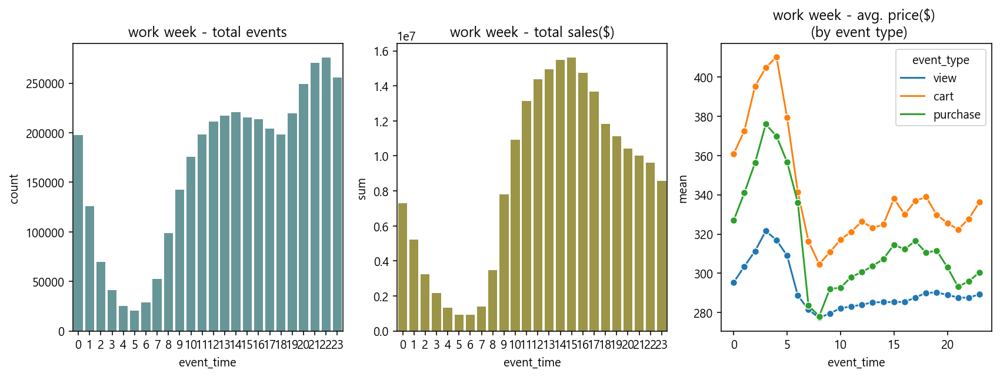

In [110]:
# 그래프
fig, ax = plt.subplots(1,3,figsize=(14,4.5))

color_1 = '#5F9EA0'
color_2 = '#AAA139'

# ax0
x = df_samp['event_time'].dt.hour
g = sns.countplot(x = x, color=color_1, ax=ax[0])
g.title.set_text('work week - total events')

# ax1
y = 'sum'
x = 'event_time'
g = sns.barplot(y=y, x=x, data=grouped_pur,
                color=color_2, ax=ax[1])
g.title.set_text('work week - total sales($)')

# ax2
y='mean'
g = sns.lineplot(y=y, x=x, hue='event_type', 
                 data=grouped, marker='o', ax=ax[2])
g.title.set_text('work week - avg. price($) \n (by event type)')

plt.show()

In [122]:
df[df['event_time'].dt.hour == 4].value_counts('category_code', normalize=True).head(10)

category_code
unknown                        0.315822
electronics.smartphone         0.265486
electronics.clocks             0.042761
electronics.audio.headphone    0.033015
computers.notebook             0.027797
electronics.video.tv           0.022786
apparel.shoes                  0.016937
apparel.shoes.keds             0.014702
computers.desktop              0.013538
auto.accessories.player        0.013098
dtype: float64

In [123]:
df[df['event_time'].dt.hour == 8].value_counts('category_code', normalize=True).head(10)

category_code
unknown                             0.346149
electronics.smartphone              0.244620
electronics.clocks                  0.027411
electronics.video.tv                0.026314
electronics.audio.headphone         0.022608
computers.notebook                  0.022337
apparel.shoes                       0.021631
appliances.kitchen.refrigerators    0.020901
appliances.kitchen.washer           0.020638
appliances.environment.vacuum       0.017495
dtype: float64

In [144]:
week 
pur = df[df['event_type']=='purchase']
pur['dow'] = pur['event_time'].dt.dayofweek
pur['hour'] = pur['event_time'].dt.hour

grouped = pur.groupby(['dow','hour'])['price'].sum()
grouped = grouped.reset_index()

pv = pd.pivot_table(grouped, index='dow', columns='hour', values='price')
pv

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
dow,,,,,,,,,,,,,,,,,,,,,
0,1.103380e+06,861972.000,459746.71875,371627.46875,199433.906250,144651.015625,129147.703125,246166.703125,553513.8750,1154157.750,...,2225187.50,2291124.750,2228572.750,2051679.500,1783292.125,1580515.625,1483977.500,1454053.875,1428881.000,1244013.750
1,9.965583e+05,690608.250,458206.65625,281303.25000,158508.093750,92870.218750,135417.171875,190387.437500,517683.1250,1158985.875,...,2290273.00,2335012.750,1973992.000,1814454.000,1597222.500,1489320.875,1433560.500,1452904.125,1461693.375,1216285.125
2,1.076451e+06,727430.000,451736.81250,309888.50000,167732.812500,136606.234375,124848.390625,225584.718750,510970.1875,1202878.375,...,2181669.25,2424391.500,2197200.750,2013394.500,1883078.125,1756441.625,1571999.375,1518043.625,1421595.875,1257805.125
3,9.871675e+05,761594.000,449984.31250,301517.65625,193149.843750,120171.789062,122309.718750,176236.953125,523075.8125,1133493.500,...,2250212.75,2188742.500,2080815.125,1946402.625,1576368.000,1515654.375,1512641.750,1434882.125,1370115.000,1170984.500
4,1.081339e+06,787204.125,467753.68750,326221.75000,218107.609375,152755.734375,135442.375000,204942.046875,537469.0000,1168918.000,...,2222415.75,2186172.250,2028978.875,1968089.250,1663184.000,1665447.750,1547679.500,1478999.250,1429093.000,1221206.875
5,1.034177e+06,710397.750,465354.43750,298026.37500,201068.375000,126895.078125,146818.359375,197056.593750,442706.6250,1013143.500,...,2123542.25,1896829.875,2038183.375,1868004.875,1574123.750,1489368.000,1425019.750,1329567.875,1227237.625,1116247.875
6,1.010493e+06,687876.375,496272.50000,280292.68750,185023.625000,137284.140625,127498.320312,164987.546875,404282.3750,976245.750,...,2177801.75,2303931.500,2194421.500,2020121.750,1731201.500,1637345.750,1433127.000,1358399.250,1264858.875,1328742.125


In [154]:
week_lst = list(set(df['event_time'].dt.week))
week_lst

[41, 42, 43, 44]

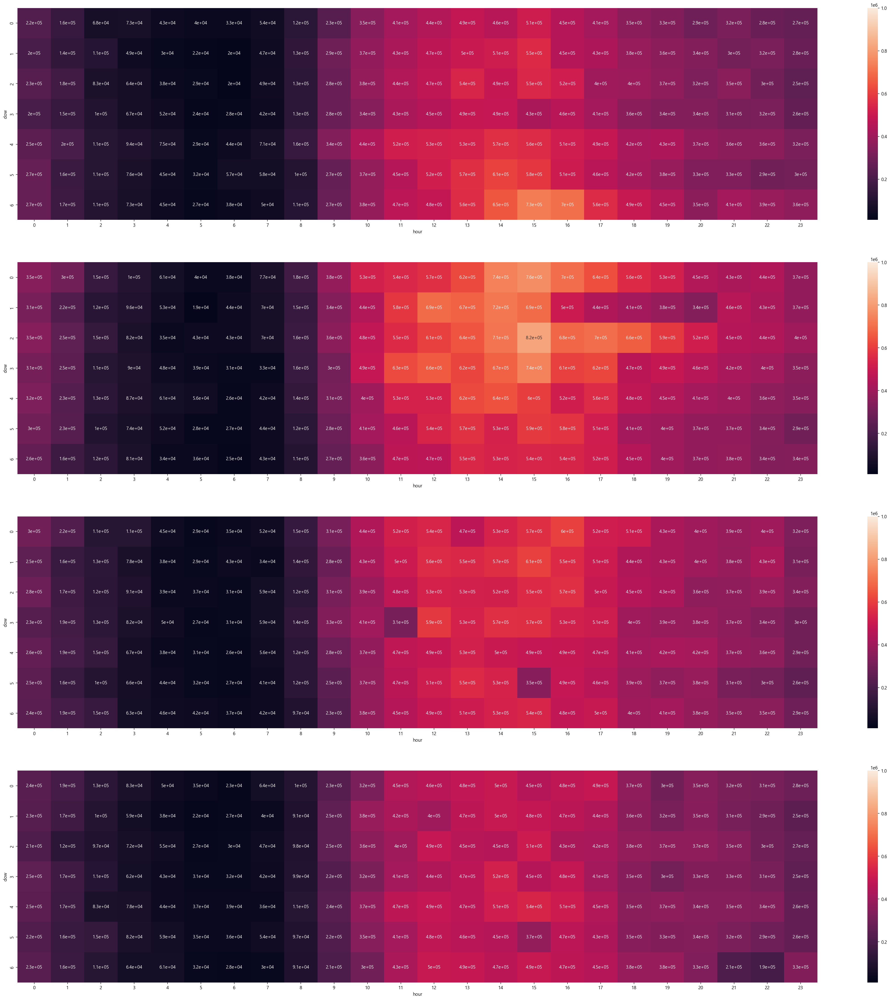

In [173]:
# 주차별 - 요일x시간별 총매출
fig, ax = plt.subplots(4,1, figsize=(40,40))

cond = df['event_type']=='purchase'
pur = df[cond]

pur['week']= pur['event_time'].dt.week
pur['dow'] = pur['event_time'].dt.dayofweek
pur['hour'] = pur['event_time'].dt.hour

for i, w in enumerate(week_lst):
    cond_w = pur['week'] == w
    pur_w = pur[cond_w]

    pv = pd.pivot_table(pur_w, index='dow', columns='hour', values='price', aggfunc='sum')
    
    sns.heatmap(pv, annot=pv, ax=ax[i], vmin=10000, vmax=1000000)
    
    
plt.show()

### `price`-`product_id`

In [182]:
# 구매 데이터 이용
cond = df['event_type'] =='purchase'
pur = df[cond]
pur.head()

,event_time,event_type,product_id,category_code,brand,price,user_id,user_session,1M_yn,cat_code_l,pid_group
7459415,2019-10-07 00:00:00+06:00,purchase,1004249,electronics.smartphone,apple,730.260010,541445418,eae8b127-0020-4603-ad35-6d0785261006,True,electronics,0
7459416,2019-10-07 00:00:00+06:00,purchase,1005073,electronics.smartphone,samsung,1152.869995,513860677,06c32535-d1b7-40e5-b78e-2aba8a0a5304,True,electronics,0
7460251,2019-10-07 00:00:39+06:00,purchase,1801690,electronics.video.tv,samsung,370.529999,520100233,5c3dc6b5-b82d-45f4-a80b-13e8fb9c026b,True,electronics,0
7460252,2019-10-07 00:00:39+06:00,purchase,5301241,unknown,vitek,28.240000,535194023,45af1a93-dde0-4b8f-8687-21cc874efefe,False,unknown,0
7460317,2019-10-07 00:00:43+06:00,purchase,1004833,electronics.smartphone,samsung,173.929993,540774309,d150e189-4254-447d-81c1-71a193c81e2f,True,electronics,0


In [183]:
# product_id 카테고리화
pur['pid_group'] = pur['product_id'] // 10000000
pur.head()

,event_time,event_type,product_id,category_code,brand,price,user_id,user_session,1M_yn,cat_code_l,pid_group
7459415,2019-10-07 00:00:00+06:00,purchase,1004249,electronics.smartphone,apple,730.260010,541445418,eae8b127-0020-4603-ad35-6d0785261006,True,electronics,0
7459416,2019-10-07 00:00:00+06:00,purchase,1005073,electronics.smartphone,samsung,1152.869995,513860677,06c32535-d1b7-40e5-b78e-2aba8a0a5304,True,electronics,0
7460251,2019-10-07 00:00:39+06:00,purchase,1801690,electronics.video.tv,samsung,370.529999,520100233,5c3dc6b5-b82d-45f4-a80b-13e8fb9c026b,True,electronics,0
7460252,2019-10-07 00:00:39+06:00,purchase,5301241,unknown,vitek,28.240000,535194023,45af1a93-dde0-4b8f-8687-21cc874efefe,False,unknown,0
7460317,2019-10-07 00:00:43+06:00,purchase,1004833,electronics.smartphone,samsung,173.929993,540774309,d150e189-4254-447d-81c1-71a193c81e2f,True,electronics,0


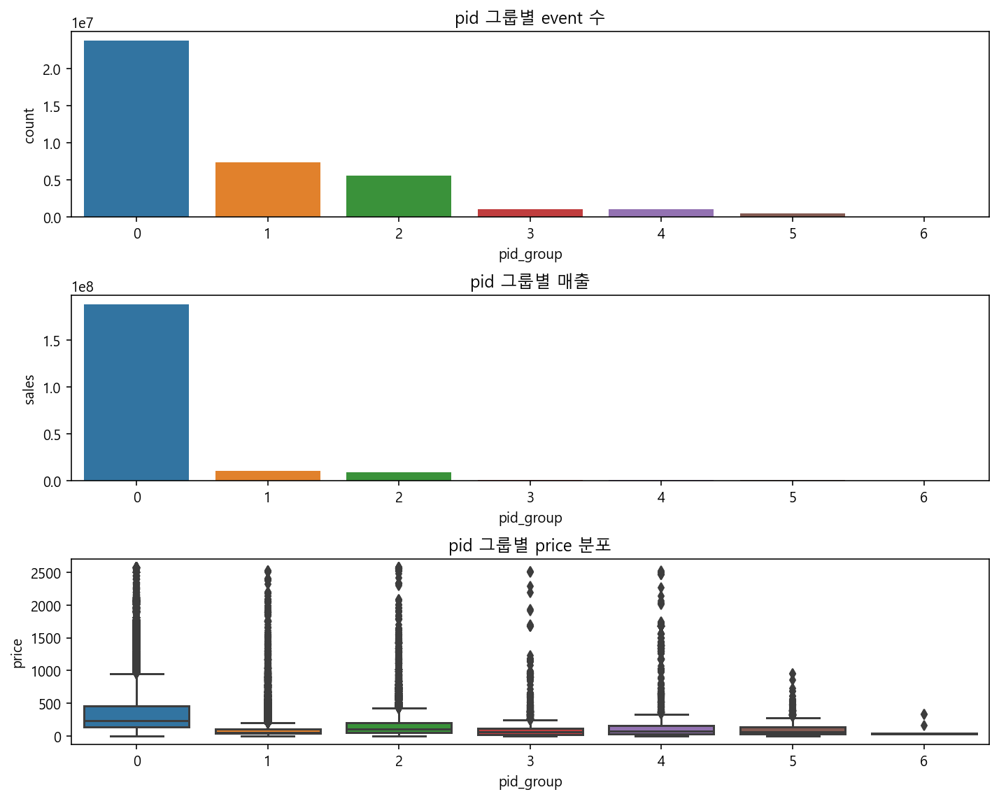

In [281]:
fig, ax = plt.subplots(3,1, figsize=(10,8))

y = 'price'
x = 'pid_group'

#count
sns.countplot(x=x, data=df, ax=ax[0])
ax[0].set_title('pid 그룹별 event 수')

# #총 매출
y='sales'
grouped=pur.groupby('pid_group')['price'].sum().reset_index().rename(columns={'price':'sales'})
sns.barplot(y=y, x=x, data=grouped, ax=ax[1])
ax[1].set_title('pid 그룹별 매출')

# box - price
y='price'
sns.boxplot(y=y, x=x, data=pur, ax=ax[2])
ax[2].set_title('pid 그룹별 price 분포')

plt.tight_layout()
plt.show()

### `price` - `category_code`
- 전자기기, 컴퓨터, 가전의 매출이 전체의 85% 이상이다. 
- 카테고리 다양화 필요하다. 

In [243]:
df['cat_code_l'] = df['category_code'].apply(lambda x:x.split('.')[0])
df.head()

,event_time,event_type,product_id,category_code,brand,price,user_id,user_session,1M_yn,cat_code_l,pid_group
7459403,2019-10-07 00:00:00+06:00,view,9000688,kids.toys,gulliver,55.340000,552861743,174349a3-dd1a-40b0-a926-1f78182b0662,False,kids,0
7459404,2019-10-07 00:00:00+06:00,view,21408696,electronics.clocks,casio,52.250000,540034779,417c7d3d-9a38-46ac-9bf8-d4831d94075e,False,electronics,2
7459405,2019-10-07 00:00:00+06:00,view,28717064,apparel.shoes.keds,strobbs,51.220001,557457756,267b4ed5-4329-43c9-bac6-49820c3a4b74,False,apparel,2
7459406,2019-10-07 00:00:00+06:00,cart,1307377,computers.notebook,lenovo,437.559998,512766859,fb25b235-cbb4-4628-8a8a-7f6643eab9a7,True,computers,0
7459407,2019-10-07 00:00:00+06:00,view,22900231,furniture.bedroom.pillow,candide,22.440001,515168282,d2ad0cb5-7afb-4266-ab8b-c9d55ea115b6,False,furniture,2


In [269]:
grouped = pur.groupby(['pid_group','cat_code_l'])['price'].sum().reset_index(name='sales')
pv = pd.pivot_table(grouped, index='pid_group', columns='cat_code_l', values='sales')
pv

cat_code_l,accessories,apparel,appliances,auto,computers,construction,country_yard,electronics,furniture,kids,medicine,sport,stationery,unknown
pid_group,,,,,,,,,,,,,,
0,NaN,1350.000000,1.191170e+07,1.005854e+06,9.829768e+06,100106.617188,NaN,1.587465e+08,2.293916e+05,367776.062500,NaN,NaN,NaN,5.738421e+06
1,15465.860352,NaN,2.537142e+05,1.791110e+03,1.613807e+05,533285.562500,NaN,3.930537e+05,1.353420e+06,203728.250000,NaN,170529.375000,1876.540039,7.142799e+06
2,42501.179688,533416.375000,9.178110e+03,1.008127e+04,1.654841e+04,33745.519531,5519.959961,5.958654e+05,1.698488e+04,NaN,12105.730469,103706.968750,NaN,7.064967e+06
3,898.049988,17559.148438,9.997210e+03,NaN,6.634930e+03,159425.093750,5530.030273,NaN,6.922810e+03,2014.679932,NaN,3092.929932,NaN,4.064383e+05
4,2212.820068,21068.560547,6.146090e+03,1.415540e+04,1.925460e+03,21805.890625,NaN,NaN,5.559173e+04,39815.968750,NaN,1188.160034,NaN,6.154020e+05
5,3374.209961,36047.769531,2.417491e+04,6.986005e+04,NaN,1487.089966,NaN,5.707300e+02,NaN,NaN,NaN,304.760010,323.470001,7.949391e+04
6,NaN,NaN,NaN,NaN,NaN,443.359985,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.159700e+02


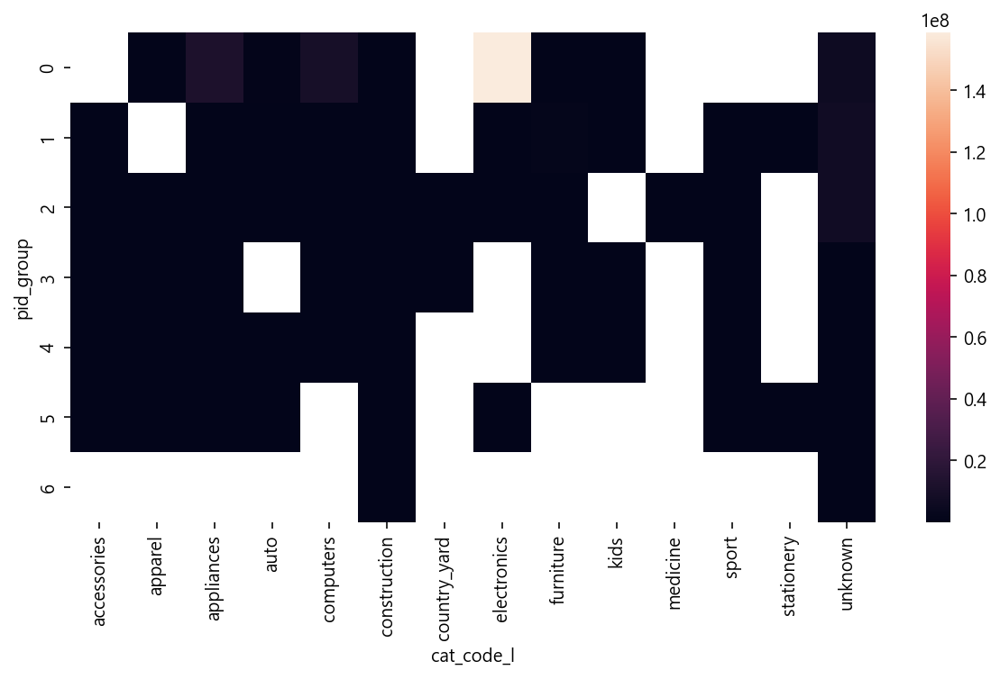

In [270]:
# 전자기기, 컴퓨터, 가전의 매출이 주르르 이룬다. 
# 다른 카테고리의 매출증가가 필요하다.
plt.figure(figsize=(10,5))
sns.heatmap(pv)
plt.show()

In [271]:
grouped = pur.groupby('cat_code_l')['price'].sum()
total_sales = grouped.sum()

(grouped/total_sales *100).sort_values(ascending=False).reset_index(name='prop. (%)')

,cat_code_l,prop. (%)
0,electronics,76.714546
1,unknown,10.108641
2,appliances,5.866314
3,computers,4.810392
4,furniture,0.798339
5,auto,0.529121
6,construction,0.408363
7,kids,0.294559
8,apparel,0.292690
9,sport,0.133907


### `price` - `brand`
1. unknown event비율이 높은데(14.46%, 1위) 실제 구매(7.93% 3위)는 상대적으로 떨어진다, 매출은 더 낮다(3.75%, 4위). 
    - unknown brand는 event만 발생시키고, 실제 구매로 이어지지 않는다.
    - 어떤 경우가 unknown인지 정의가 필요하다.
</br></br>
2. apple의 판매건수(19.03%,2위)는 samsung(23.3%, 1위)보다 적은데, 매출액은 samsung의 약 2배다(48.29%, 1위)
3. apple의 판매단가가 독보적으로 높다.

In [376]:
grouped = pur.groupby('brand')['price'].sum().sort_values(ascending=False)
grouped.head(10)


brand
apple      1.005504e+08
samsung    4.223680e+07
xiaomi     8.368729e+06
unknown    7.817846e+06
huawei     4.274815e+06
acer       3.137580e+06
lg         3.003085e+06
lucente    2.852471e+06
sony       2.268749e+06
oppo       2.249202e+06
Name: price, dtype: float32

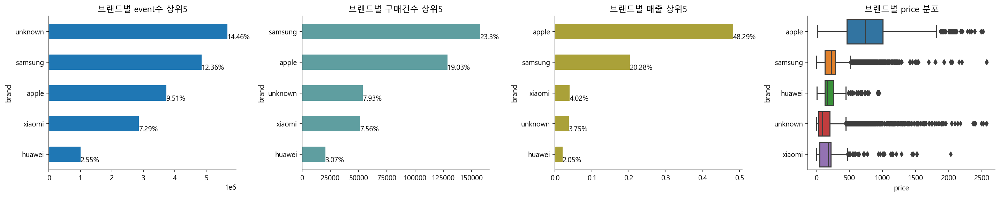

In [374]:
# 그래프
fig, ax = plt.subplots(1,4, figsize=(20,4))

# ax0 - event count
grouped = df.value_counts('brand', sort=True).head().sort_values()
g = grouped.plot(kind='barh',  ax=ax[0])
g.set_title('브랜드별 event수 상위5')

# 수치 기입
for bar, val in zip(g.patches, grouped.values):
    g.annotate(f'{round(val/len(df)*100,2)}%', (val, bar.get_y()))

# ax1 - 구매count
grouped = pur.value_counts('brand', sort=True).head().sort_values()
g = grouped.plot(kind='barh', color = color_1, ax=ax[1])
g.set_title('브랜드별 구매건수 상위5')

# 수치 기입
for bar, val in zip(g.patches, grouped.values):
    g.annotate(f'{round(val/len(pur)*100,2)}%', (val, bar.get_y()))


# 매출
grouped = pur.groupby('brand')['price'].sum().sort_values(ascending=False)
total_sales = grouped.sum()

grouped = grouped.head(5) / total_sales
grouped = grouped.sort_values()
g = grouped.plot(kind='barh', color = color_2, ax=ax[2])
g.set_title('브랜드별 매출 상위5')

for bar, val in zip(g.patches, grouped.values):
    g.annotate(f'{round(val*100,2)}%', (val, bar.get_y()))


# 브랜드별 price 분포 
grouped = pur.groupby('brand')['price'].sum().sort_values(ascending=False).head(5)
sales_top5 = set(grouped.index)
tmp = pur[pur['brand'].isin(sales_top5)]
tmp['brand'] = tmp['brand'].astype('object')

y='brand'
x='price'
g = sns.boxplot(y=y,x=x, data=tmp, ax=ax[3])
g.set_title('브랜드별 price 분포')

sns.despine()
plt.tight_layout()
plt.show()

### `price` - `user_id`
- 이상치(많이 구매하는사람)의 특징은 무엇인가

In [396]:
table = pd.DataFrame(pur.groupby('user_id')['price'].sum().describe()).T
table 

,count,mean,std,min,25%,50%,75%,max
price,323621.0,643.356995,2002.03772,0.88,102.940002,241.979996,584.01001,253101.59375


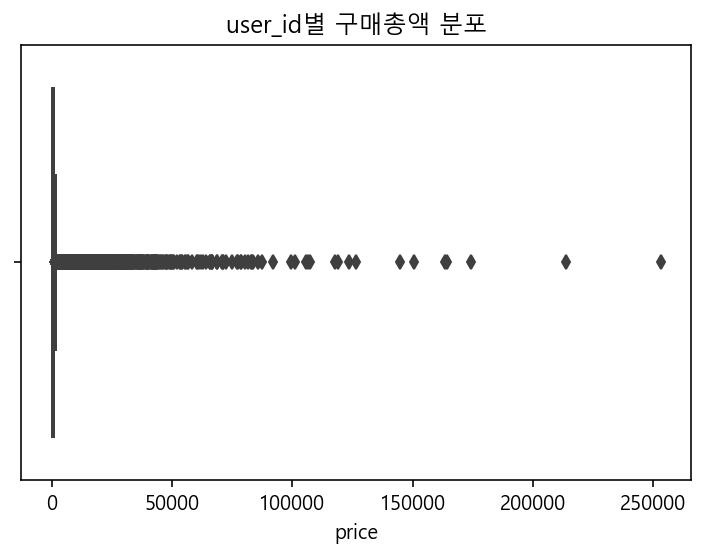

In [472]:
grouped = pur.groupby('user_id')['price'].sum().reset_index()
sns.boxplot(x='price', data=grouped)
plt.title('user_id별 구매총액 분포');

In [406]:
# IQR 설정
Q1 = grouped['price'].quantile(0.25)
Q3 = grouped['price'].quantile(0.75)
IQR = Q3-Q1
print(Q1,Q3,IQR)

102.94000244140625 584.010009765625 481.07000732421875


In [420]:
# 이상치 여부 설정
whis_lower = Q1-1.5*IQR
whis_upper = Q3+1.5*IQR

lower = grouped['price'] >= whis_lower
upper = grouped['price'] <= whis_upper

# 이상치에 해당하는 user_id
outlier = grouped[~lower | ~upper]['user_id'].values

In [423]:
# 컬럼생성
pur['user_outlier_yn'] = np.where(pur['user_id'].isin(outlier), 1, 0)
pur.head()

,event_time,event_type,product_id,category_code,brand,price,user_id,user_session,1M_yn,cat_code_l,pid_group,user_outlier_yn
7459415,2019-10-07 00:00:00+06:00,purchase,1004249,electronics.smartphone,apple,730.260010,541445418,eae8b127-0020-4603-ad35-6d0785261006,True,electronics,0,0
7459416,2019-10-07 00:00:00+06:00,purchase,1005073,electronics.smartphone,samsung,1152.869995,513860677,06c32535-d1b7-40e5-b78e-2aba8a0a5304,True,electronics,0,1
7460251,2019-10-07 00:00:39+06:00,purchase,1801690,electronics.video.tv,samsung,370.529999,520100233,5c3dc6b5-b82d-45f4-a80b-13e8fb9c026b,True,electronics,0,1
7460252,2019-10-07 00:00:39+06:00,purchase,5301241,unknown,vitek,28.240000,535194023,45af1a93-dde0-4b8f-8687-21cc874efefe,False,unknown,0,0
7460317,2019-10-07 00:00:43+06:00,purchase,1004833,electronics.smartphone,samsung,173.929993,540774309,d150e189-4254-447d-81c1-71a193c81e2f,True,electronics,0,0


- 이상치에 해당하는 user의 경우 apple 구매 건수 및  매출액이 독보적으로 높다.
    - apple 프로모션을 열심히

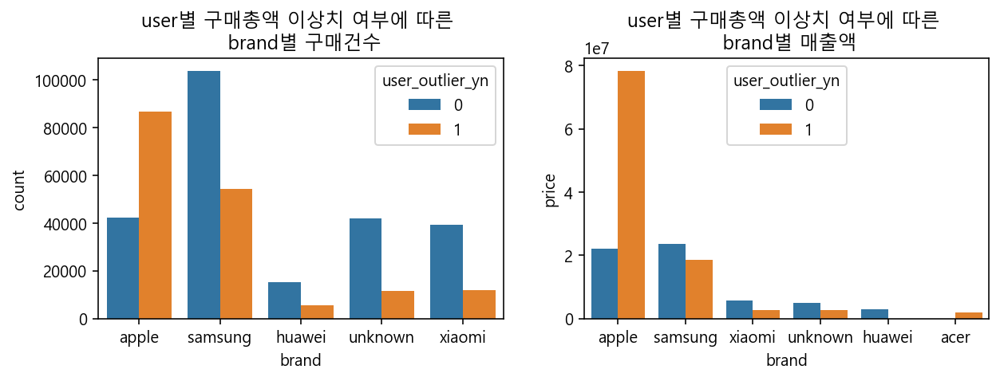

In [443]:
fig, ax = plt.subplots(1,2, figsize=(10,3))

#ax0
grouped = pur.groupby('brand')['price'].sum().sort_values(ascending=False).head(5)
sales_top5 = set(grouped.index)
tmp = pur[pur['brand'].isin(sales_top5)]
tmp['brand'] = tmp['brand'].astype('object')

g=sns.countplot(x='brand', data=tmp, hue='user_outlier_yn', ax=ax[0])
g.set_title('user별 구매총액 이상치 여부에 따른 \n brand별 구매건수')

#ax1
grouped = pur.groupby(['brand','user_outlier_yn'])['price'].sum().sort_values(ascending=False).head(10)
grouped = grouped.reset_index()
grouped['brand'] = grouped['brand'].astype('object')

g = sns.barplot(y='price',x='brand',hue='user_outlier_yn',data=grouped, ax=ax[1])
g.set_title('user별 구매총액 이상치 여부에 따른 \n brand별 매출액')
plt.show()

---

# 전체 데이터 분석

## 데이터로드
- 코호트분석용 데이터 로드

In [1]:
# 라이브러리 모음
#데이터셋 처리
import pandas as pd 
import numpy as np
import pyarrow as pa
import pyarrow.parquet as pq
from copy import deepcopy
from collections import defaultdict

#변수명 문자형태로 출력
from varname import nameof
import inspect, re

#시각화
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
rc('mathtext', default='regular')

# 오프라인에서 plotly 그래프 띄우기
import plotly.offline as pyo
import plotly.graph_objects as go
pyo.init_notebook_mode()
# import plotly standard
import plotly.express as px
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
# Cufflinks wrapper on plotly
import cufflinks as cf
# Display all cell outputs
from IPython.core.interactiveshell import InteractiveShell
# plotly + cufflinks in offline mode
from plotly.offline import iplot
cf.go_offline()
# set the global theme
cf.set_config_file(world_readable=True, theme='pearl', offline=True)

#시간 데이터 처리
from datetime import datetime, timedelta, timezone
import datetime as dt
import time
from dateutil import tz

import warnings
warnings.simplefilter("ignore" )

In [2]:
# 그래프 한글폰트 출력을 위한 코드
def get_font_family():
    '''
    시스템 환경에 따른 기본 폰트명을 반환하는 함수
    '''
    import platform
    system_name = platform.system()
    # mac OS 일때
    if system_name == 'Darwin' :
        font_faimly = 'AppleGothic'
    # 윈도우일떄 
    elif system_name == 'Windows':
        font_family = 'Malgun Gothic'
    else:
        # Linux(colab)
        !apt-get install fonts-nanum -qq > /dev/null
        !fc-cache -fv

        import matplotlib as mpl
        mpl.font_manager._rebuild()
        findfont = mpl.font_manager.fontManager.findfont
        mpl.font_manager.findfont = findfont
        mpl.backends.backend_agg.findfont = findfont

        font_family = 'NanumBarunGothic'

    return font_family

# style 설정은 꼭 폰트설정 위에서 한다. 
# style에 폰트 설정이 들어있으면 한글폰트가 초기화 되어 깨진다.
# plt.style.use('seaborn')

#폰트설정
plt.rc('font', family=get_font_family())

#마이너스폰트 설정
plt.rc('axes', unicode_minus=False)

# 그래프에 retina display 적용
# 그래프 해상도 
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

In [3]:
%%time
# file_list = ['2019-Oct','2019-Nov', '2019-Dec', '2020-Jan','2020-Feb','2020-Mar','2020-Apr']
file_list = ['2020-Feb','2020-Mar','2020-Apr']

PATH_INPUT = './input/'

for fname in file_list:
    PATH = PATH_INPUT + f'{fname}_engineered(drop_dup).parquet'
    
    # file명 이용하여 변수명 지정
    tmp = 'df_'+fname[2:].lower().replace('-','_') 
    locals()[tmp] = pd.read_parquet(PATH, engine='pyarrow')
    
    
    print(fname, locals()[tmp].shape)
    print('=='*10)
    
    time.sleep(5)

2020-Feb (54526529, 8)
2020-Mar (56149664, 8)
2020-Apr (66442134, 8)
Wall time: 1min 32s


## 전처리

### time zone 변경

In [4]:
# time zone 변경
# df_lst = ['df_19_oct', 'df_19_nov', 'df_19_dec', 
#           'df_20_jan', 'df_20_feb', 'df_20_mar', 'df_20_apr']
df_lst = ['df_20_feb', 'df_20_mar', 'df_20_apr']

for df in df_lst:
    print(df)
    locals()[df]['event_time'] = locals()[df]['event_time'].dt.tz_localize(tz.UTC)        # UTC localize
    print('변경 전:',locals()[df]['event_time'][0] )
    locals()[df]['event_time'] = locals()[df]['event_time'].dt.tz_convert('Asia/Almaty')  # 알마티(카자흐스탄) 시간대 적용
    print('변경 후:',locals()[df]['event_time'][0] )
    print('========'*5)

df_20_feb
변경 전: 2020-02-01 00:00:00+00:00
변경 후: 2020-02-01 06:00:00+06:00
df_20_mar
변경 전: 2020-03-01 00:00:00+00:00
변경 후: 2020-03-01 06:00:00+06:00
df_20_apr
변경 전: 2020-04-01 00:00:00+00:00
변경 후: 2020-04-01 06:00:00+06:00


### 가격 0인 데이터 제거 
- 가격이 0인 제품의 구매는 없음
- 허위매물 광고?, 아님 품절 상품?
    - 직접 판단하기 어려우니 현재 분석에서는 제거해준다.

In [5]:
# 가격이 0인 10월 데이터의 event_type
cond = df_19_oct['price'] == 0
tmp = df_19_oct[cond]
tmp.value_counts('event_type')

NameError: name 'df_19_oct' is not defined

In [6]:
def remove_zero(df):
    cond = df['price'] == 0
    tmp = df[cond].index
    df = df.drop(tmp).reset_index(drop=True)
    return df

In [7]:
# df_arr = [df_19_oct, df_19_nov, df_19_dec, df_20_jan, df_20_feb, df_20_mar, df_20_apr]
df_arr = [df_20_feb, df_20_mar, df_20_apr]

for df in df_arr:
    df = remove_zero(df)
    time.sleep(1)

### WW 기준 데이터셋 구분
- 10월 마지막주 & 11월 첫주 -> WW 44
- 11월 데이터셋 中 44주에 해당하는 rows를 10월 데이터셋으로 옮겨준다.
- 주차별 분석을 위해서

In [8]:
def feat_eng(df_1,df_2):
    '''서로 다른 데이터셋에 같은 주(week)값이 없도록 조작'''
    # df_1의 week컬럼 unique밸류의 마지막 값 추출
    val = df_1['event_time'].dt.week.unique()[-1]
    
    # df_2에서 val 값에 해당하는 rows를 추출 후
    cond = df_2['event_time'].dt.week == val
    tmp = df_2[cond]
    
    # df_1으로 concat해주고 df_2에서 해당 값 제거
    df_1 = pd.concat([df_1,tmp]).reset_index(drop=True)
    df_2 = df_2.drop(tmp.index)
    
    return df_1, df_2

In [9]:
# 함수가 제대로 작동 안해서 하나씩 진행
# 나중에 디버그 실행
# %%time
# # 전체 데이터셋 실행
# df_arr = [df_19_oct, df_19_nov, df_19_dec, df_20_jan, df_20_feb, df_20_mar, df_20_apr]


# for i in range(len(df_arr) - 1):
#     df_arr[i], df_arr[i+1] = feat_eng(df_arr[i], df_arr[i+1])
#     print('======'*20)

In [22]:
# 19-oct vs 19-nov
df_19_oct, df_19_nov = feat_eng(df_19_oct, df_19_nov)

fname = nameof(df_19_oct)
PATH = f'./input/{fname}(v2.0).parquet'

df_19_oct.to_parquet(PATH, engine='pyarrow', index=False, compression='ZSTD')

In [27]:
# 19-nov vs 19-dec
df_19_nov, df_19_dec = feat_eng(df_19_nov, df_19_dec)

fname = nameof(df_19_nov)
PATH = f'./input/{fname}(v2.0).parquet'

df_19_nov.to_parquet(PATH, engine='pyarrow', index=False, compression='ZSTD')

In [28]:
# 19_dec vs 20_jan
df_19_dec, df_20_jan = feat_eng(df_19_dec, df_20_jan)

fname = nameof(df_19_dec)
PATH = f'./input/{fname}(v2.0).parquet'

df_19_dec.to_parquet(PATH, engine='pyarrow', index=False, compression='ZSTD')

In [29]:
# 20_jan vs 20_feb
df_20_jan, df_20_feb = feat_eng(df_20_jan, df_20_feb)

fname = nameof(df_20_jan)
PATH = f'./input/{fname}(v2.0).parquet'

df_20_jan.to_parquet(PATH, engine='pyarrow', index=False, compression='ZSTD')

In [10]:
# 20_feb vs 20_mar
df_20_feb, df_20_mar = feat_eng(df_20_feb, df_20_mar)

fname = nameof(df_20_feb)
PATH = f'./input/{fname}(v2.0).parquet'

df_20_feb.to_parquet(PATH, engine='pyarrow', index=False, compression='ZSTD')

In [11]:
# 20_mar vs 20_apr
df_20_mar, df_20_apr = feat_eng(df_20_mar, df_20_apr)

fname = nameof(df_20_mar)
PATH = f'./input/{fname}(v2.0).parquet'

df_20_mar.to_parquet(PATH, engine='pyarrow', index=False, compression='ZSTD')

In [12]:
fname = nameof(df_20_apr)
PATH = f'./input/{fname}(v2.0).parquet'

df_20_apr.to_parquet(PATH, engine='pyarrow', index=False, compression='ZSTD')

## Funnel 분석
- 전체 데이터 (19년 10월 ~ 20년 4월) 분석

- 전처리된 데이터 불러오기 

In [13]:
df_19_oct = pd.read_parquet('./input/df_19_oct(v2.0).parquet', engine='pyarrow')
df_19_nov = pd.read_parquet('./input/df_19_nov(v2.0).parquet', engine='pyarrow')
df_19_dec = pd.read_parquet('./input/df_19_dec(v2.0).parquet', engine='pyarrow')
df_20_jan = pd.read_parquet('./input/df_20_jan(v2.0).parquet', engine='pyarrow')
df_20_feb = pd.read_parquet('./input/df_20_feb(v2.0).parquet', engine='pyarrow')
df_20_mar = pd.read_parquet('./input/df_20_mar(v2.0).parquet', engine='pyarrow')
df_20_apr = pd.read_parquet('./input/df_20_apr(v2.0).parquet', engine='pyarrow')

### 월별 funnel
- 2019년 11월부터 cart 전환율이 높아졌다.
    - 어떠한 계기로 높아진건지?
    - 원래 11월 정도의 수준인데, 19년 10월만 문제인건지?

In [15]:
# funnel 분석 함수
def namestr(obj, namespace):
    arr = [name for name in namespace if namespace[name] is obj]
    return arr[0][3:]

def funnel(df):
    # event type 출력 부분
    tmp = df['event_type']
    tmp = tmp.value_counts().loc[['view','cart','purchase']]
    display(pd.DataFrame(tmp).T)
    
    # 전환율 출력
    v2c = tmp.loc['cart']/tmp.loc['view']
    c2p = tmp.loc['purchase']/tmp.loc['cart']
    final = v2c * c2p
    print()
    print('view->cart 전환율 :', round(v2c*100, 2),"%" )
    print('cart->purchase 전환율 :', round(c2p*100, 2),"%")
    print('최종 전환율 :', round(final*100,2),"%" )
    
    # funnel 그래프 출력 부분
    data = dict(number=tmp.values, stage=tmp.index)
    fig = px.funnel(data, x='number', y='stage')
    fig.update_layout(
        title={'text': "Funnel Graph -"+" "+namestr(df,globals()),
        'y':0.95, 'x':0.5, 'xanchor': 'center', 'yanchor': 'top'})
    
    # 그래프 크기 조절
    fig.update_layout(autosize=False, width=500, height=400)
    fig.show()

In [16]:
funnel(df_19_oct)

,view,cart,purchase
event_type,44975408,953145,806709



view->cart 전환율 : 2.12 %
cart->purchase 전환율 : 84.64 %
최종 전환율 : 1.79 %


In [17]:
funnel(df_19_nov)

,view,cart,purchase
event_type,60806220,2949286,878575



view->cart 전환율 : 4.85 %
cart->purchase 전환율 : 29.79 %
최종 전환율 : 1.44 %


In [18]:
funnel(df_19_dec)

,view,cart,purchase
event_type,69618995,3571887,1218946



view->cart 전환율 : 5.13 %
cart->purchase 전환율 : 34.13 %
최종 전환율 : 1.75 %


In [19]:
funnel(df_20_jan)

,view,cart,purchase
event_type,48278554,2372837,813960



view->cart 전환율 : 4.91 %
cart->purchase 전환율 : 34.3 %
최종 전환율 : 1.69 %


In [20]:
funnel(df_20_feb)

,view,cart,purchase
event_type,48336024,2419721,1011509



view->cart 전환율 : 5.01 %
cart->purchase 전환율 : 41.8 %
최종 전환율 : 2.09 %


In [21]:
funnel(df_20_mar)

,view,cart,purchase
event_type,57999406,3150258,1133908



view->cart 전환율 : 5.43 %
cart->purchase 전환율 : 35.99 %
최종 전환율 : 1.96 %


In [22]:
funnel(df_20_apr)

,view,cart,purchase
event_type,55220117,2755688,833803



view->cart 전환율 : 4.99 %
cart->purchase 전환율 : 30.26 %
최종 전환율 : 1.51 %


### 월별 x 단계별 전환율

- 월별 전환율 데이터프레임 생성

In [23]:
df_arr = [df_19_oct, df_19_nov, df_19_dec, df_20_jan, df_20_feb, df_20_mar, df_20_apr]
arr_type = ['view','cart','purchase']

arr = []
for df in df_arr:
    tmp = df['event_type']
    tmp = tmp.value_counts().loc[arr_type]
    arr.append(list(tmp.values))
    
df = pd.DataFrame(arr, columns=arr_type)
df['CVR(v->c)'] = (df['cart'] / df['view'] * 100).round(2)
df['CVR(c->p)'] = (df['purchase'] / df['cart'] * 100).round(2)
df['CVR(v->p)'] = (df['purchase'] / df['view'] * 100).round(2)

df

,view,cart,purchase,CVR(v->c),CVR(c->p),CVR(v->p)
0,44975408,953145,806709,2.12,84.64,1.79
1,60806220,2949286,878575,4.85,29.79,1.44
2,69618995,3571887,1218946,5.13,34.13,1.75
3,48278554,2372837,813960,4.91,34.30,1.69
4,48336024,2419721,1011509,5.01,41.80,2.09
5,57999406,3150258,1133908,5.43,35.99,1.96
6,55220117,2755688,833803,4.99,30.26,1.51


- 10월 이후로 성장? or 연말 특수?
    - 11월 부터 view, cart 급등
    - 10월 -> 11월 cart 성장에 비해 purchase수 성장은 완만하다.
- 10월에만 뭔가 있었던걸까?
    - cart없이 바로 구매한 경우가 늘어났다거나 (선착순 구매의 경우 view->purchase 로 바로 가니까)
- 연초에 모든 event 감소

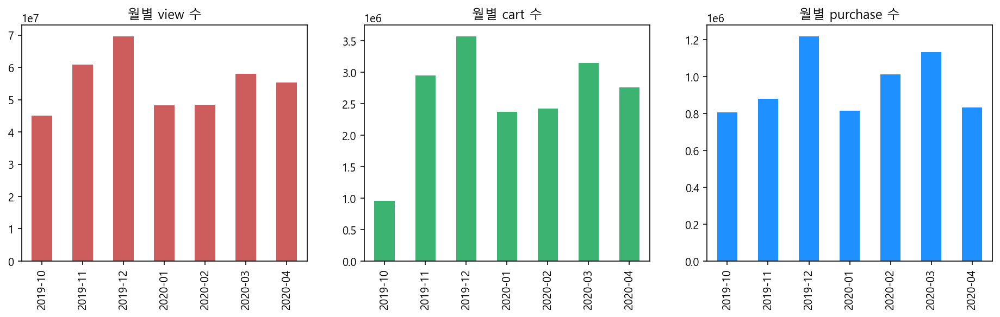

In [24]:
# 월별 event_type 수
labels = ['2019-10','2019-11','2019-12','2020-01','2020-02','2020-03','2020-04']
arr_type = ['view','cart','purchase']
arr_color = ['indianred','mediumseagreen','dodgerblue']

fig = plt.figure(figsize=(16,4))

for i, v in enumerate(zip(arr_color,arr_type), start=1):
    c = v[0]
    col = v[1]
    fig.add_subplot(1,3,i)
    g = df[col].plot(kind='bar', color=c)
    g.set_xticklabels(labels)
    plt.title(f'월별 {col} 수')

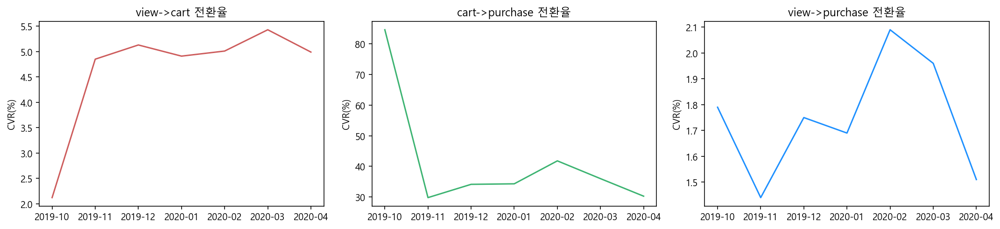

In [27]:
# 월별 단계별 전환율
labels = ['','2019-10','2019-11','2019-12','2020-01','2020-02','2020-03','2020-04']

fig = plt.figure(figsize=(15,3.5))

fig.add_subplot(131)
g = df['CVR(v->c)'].plot(color='indianred')
g.set_xticklabels(labels)
g.set_ylabel('CVR(%)')
plt.title('view->cart 전환율')

fig.add_subplot(132)
g = df['CVR(c->p)'].plot(color='mediumseagreen')
g.set_xticklabels(labels)
g.set_ylabel('CVR(%)')
plt.title('cart->purchase 전환율')

fig.add_subplot(133)
g = df['CVR(v->p)'].plot(color='dodgerblue')
g.set_xticklabels(labels)
g.set_ylabel('CVR(%)')
plt.title('view->purchase 전환율')


plt.tight_layout()
plt.show()

- 개선방법
    1. 유입을 폭발적으로 늘린다. 
    2. **전환율 개선**
        - 유입을 두 배로 늘리는 것보다, 전환율을 두 배로 늘리는 것이 더 쉽다. 

- view -> cart 전환율이 왜 낮을까?
- 시간대별로 전환율이 다를까?

## 시간별(일,요일,시간) event_type 비율

### 시간
- 19년 11월 제외 대부분 유사한 형태
- cart & purchase
    - 오후 2시경에 cart 및 purchase가 가장 높다.
        - 우리나라처럼 당일배송 같은게 가능해서 해당시간에 몰리는건가?
- view 
    - 저녁 10시경에 가장 많은 view 비율 차지
- 클라우드 성능을 시간대에 맞춰서 조절가능?
    - 속도와 영향이 있을 수 있다고 했다. (CVR 개선가능?)

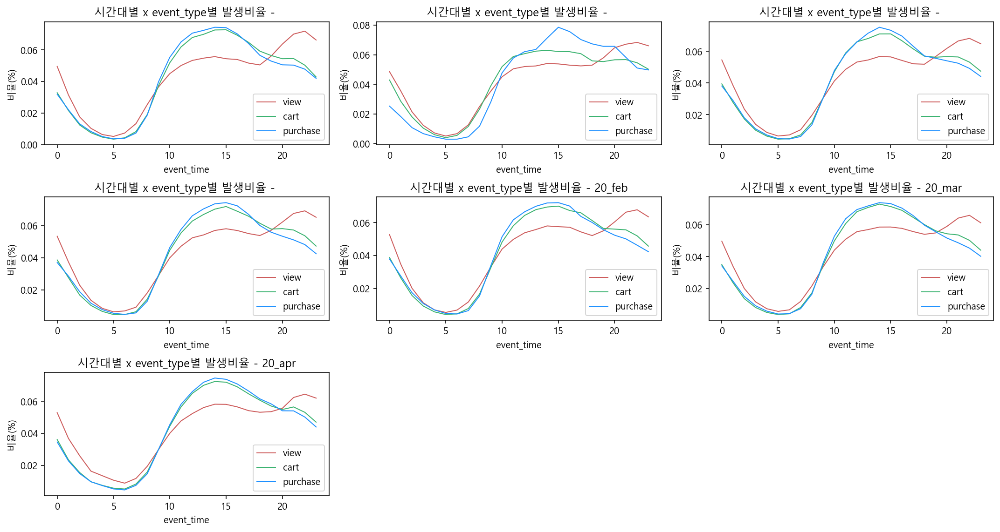

In [28]:
# 시간대별x이벤트종류별 비율
arr_df = [df_19_oct, df_19_nov, df_19_dec, df_20_jan, df_20_feb, df_20_mar, df_20_apr]

arr_type = ['view','cart','purchase']
arr_color = ['indianred','mediumseagreen','dodgerblue']


fig = plt.figure(figsize=(15,8))
for i, df in enumerate(arr_df, start=1):
    sub = df[['event_type','event_time']]
     
    fig.add_subplot(3,3,i)
    for t, c in zip(arr_type, arr_color):
        cond = sub['event_type'] == t
        tmp = sub[cond]
        grouped = tmp.value_counts(tmp['event_time'].dt.hour, normalize=True, sort=False)
        g = grouped.plot(label=t, lw=1, color=c)
    g.set_ylabel('비율(%)')
    plt.title(f'시간대별 x event_type별 발생비율 - {namestr(df,globals())}')
    plt.legend()
plt.tight_layout()
plt.show()

### 일별
- 월별로 패턴이 다양하다
- 이벤트가 있는경우 해당 시기에 구매가 집중되는 경향
- 아래 특이패턴을 제외하면 3가지 event의 일별 비율이 유사하게 흘러간다. 
- 특이패턴
    - 19년10월 cart 진폭이 다른 두 event대비 크다
    - 20년 1월말 cart 급등
    - 20년 4월 20일 purchase 급락

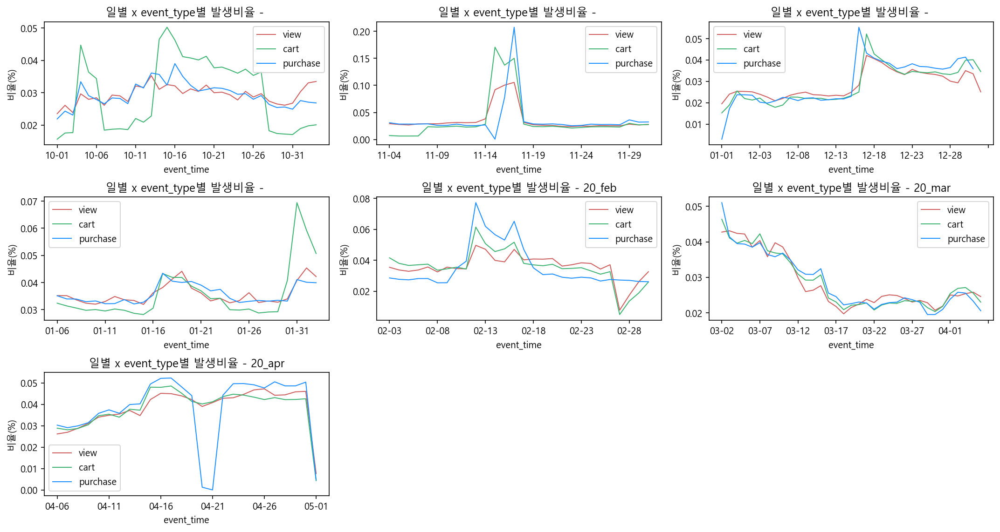

In [31]:
# 일별 시각화
arr_df = [df_19_oct, df_19_nov, df_19_dec, df_20_jan, df_20_feb, df_20_mar, df_20_apr]
arr_type = ['view','cart','purchase']
arr_color = ['indianred','mediumseagreen','dodgerblue']


fig = plt.figure(figsize=(15,8))
for i, df in enumerate(arr_df, start=1):
    sub = df[['event_type','event_time']]
    sub_spl = sub.groupby([sub['event_time'].dt.dayofyear,'event_type']).sample(frac=0.1)
     
    fig.add_subplot(3,3,i)
    for t, c in zip(arr_type, arr_color):
        cond = sub_spl['event_type'] == t
        tmp = sub_spl[cond]
        grouped = tmp.value_counts(tmp['event_time'].dt.strftime('%m-%d'), normalize=True, sort=False)
        g = grouped.plot(label=t, lw=1, color=c)
    g.set_ylabel('비율(%)')
    plt.title(f'일별 x event_type별 발생비율 - {namestr(df,globals())}')
    plt.legend()
plt.tight_layout()
plt.show()

### 요일
- 해석 어렵다.
    - 이벤트있는 경우 해당 요일에 밀집

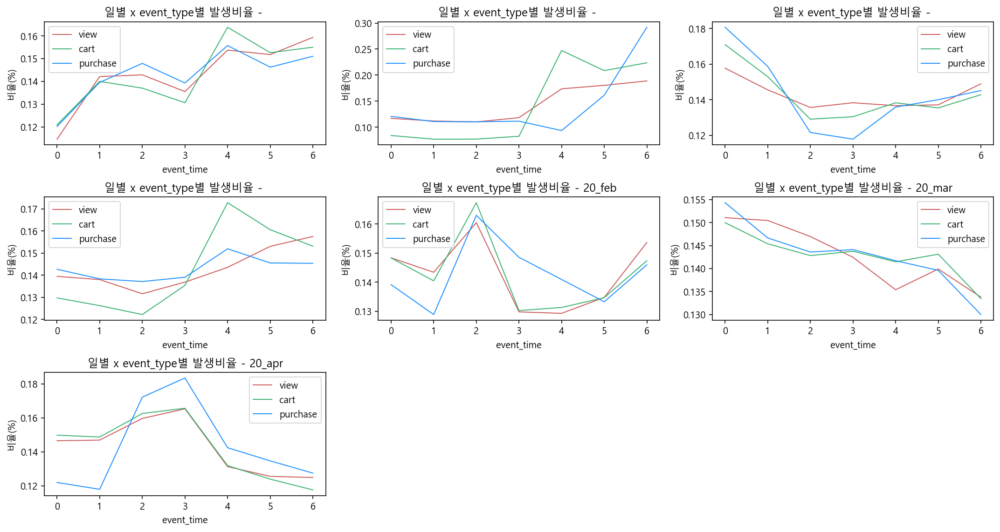

In [49]:
# 요일별 시각화
arr_df = [df_19_oct, df_19_nov, df_19_dec, df_20_jan, df_20_feb, df_20_mar, df_20_apr]
arr_type = ['view','cart','purchase']
arr_color = ['indianred','mediumseagreen','dodgerblue']


fig = plt.figure(figsize=(15,8))
for i, df in enumerate(arr_df, start=1):
    sub = df[['event_type','event_time']]
    sub_spl = sub.groupby([sub['event_time'].dt.dayofweek,'event_type']).sample(frac=0.1)
     
    fig.add_subplot(3,3,i)
    for t, c in zip(arr_type, arr_color):
        cond = sub_spl['event_type'] == t
        tmp = sub_spl[cond]
        grouped = tmp.value_counts(tmp['event_time'].dt.dayofweek, normalize=True, sort=False)
        g = grouped.plot(label=t, lw=1, color=c)
    g.set_ylabel('비율(%)')
    plt.title(f'일별 x event_type별 발생비율 - {namestr(df,globals())}')
    plt.legend()
plt.tight_layout()
plt.show()

## Cohort 분석
- 특정 기간 특정의 경험을 공유한 집단간 행동패턴을 비교/분석
- 사용자 유지와 이탈 패턴 분석 및 코호트 간 상이한 행동 패턴 분석에 사용
- 월별 그룹으로 분석
    - ex) 기존 설치자 매출은 줄어드는 반면 신규 설치자의 첫 달 매출액은 증가

### 전처리

In [33]:
def df_making_4_cohort(df):
    '''
    코호트 분석을 위한 데이터프레임 전처리
    '''
    tmp = df[['event_time', 'event_type','user_id','category_code','price']]
    # 구매자만
    tmp = tmp[tmp.event_type=='purchase']
    #단위 기간 만들기
    tmp['order_period'] = tmp['event_time'].dt.strftime('%Y-%m')    
    tmp = tmp.drop(['event_type','category_code'], axis=1)
    tmp = tmp.reset_index(drop=True).reset_index()
    tmp = tmp.rename(columns={'index':'order_id'}) # order id 부여
    tmp = tmp.set_index('user_id') 
    
    return tmp

In [34]:
%%time
# 월별 데이터프레임 전처리
oct_ = df_making_4_cohort(df_19_oct)
nov_ = df_making_4_cohort(df_19_nov)
dec_ = df_making_4_cohort(df_19_dec)
jan_ = df_making_4_cohort(df_20_jan)
feb_ = df_making_4_cohort(df_20_feb)
mar_ = df_making_4_cohort(df_20_mar)
apr_ = df_making_4_cohort(df_20_apr)

Wall time: 1min 52s


### 재구매율 기준 

In [35]:
# 월별 데이터셋 병합
df = pd.concat([oct_,nov_,dec_,jan_,feb_,mar_,apr_])

# 첫 구매 시기에 대한 컬럼 생성
FirstOrder = df.groupby(df.index)['order_period'].min()
# FirstOrder=FirstOrder.dt.strftime('%Y-%m')
df['first_order']=FirstOrder
df = df.reset_index()
df

,user_id,order_id,event_time,price,order_period,first_order
0,543272936,0,2019-10-01 06:02:14+06:00,130.759995,2019-10,2019-10
1,551377651,1,2019-10-01 06:04:37+06:00,642.690002,2019-10,2019-10
2,514591159,2,2019-10-01 06:06:02+06:00,29.510000,2019-10,2019-10
3,555332717,3,2019-10-01 06:07:07+06:00,54.419998,2019-10,2019-10
4,524601178,4,2019-10-01 06:09:26+06:00,189.910004,2019-10,2019-10
...,...,...,...,...,...,...
6697405,647021522,833798,2020-05-01 05:57:52+06:00,952.150024,2020-05,2020-05
6697406,586966635,833799,2020-05-01 05:58:35+06:00,218.539993,2020-05,2020-04
6697407,648063263,833800,2020-05-01 05:59:03+06:00,807.200012,2020-05,2020-04
6697408,621887055,833801,2020-05-01 05:59:32+06:00,10.530000,2020-05,2020-05


In [36]:
#코호트 기간으로 집계
grouped = df.groupby(['first_order','order_period'])
cohorts = grouped['user_id'].nunique()
cohorts = cohorts.reset_index()
cohorts = cohorts.rename({'user_id':'total_users'},axis=1)
cohorts

,first_order,order_period,total_users
0,2019-10,2019-10,346488
1,2019-10,2019-11,91122
2,2019-10,2019-12,76118
3,2019-10,2020-01,47441
4,2019-10,2020-02,44065
5,2019-10,2020-03,42304
6,2019-10,2020-04,27971
7,2019-10,2020-05,206
8,2019-11,2019-11,350160
9,2019-11,2019-12,77625


In [37]:
# 기간별 정렬
each_period=cohorts['first_order'].value_counts().sort_index()
each_period

2019-10    8
2019-11    7
2019-12    6
2020-01    5
2020-02    4
2020-03    3
2020-04    2
2020-05    1
Name: first_order, dtype: int64

In [38]:
# 기간별 레이블 붙이기 
cohortperiod=[]
for x in each_period: 
    for y in range(x):
        cohortperiod.append(y)

cohorts['cohort_period']=cohortperiod
cohorts = cohorts.set_index(['first_order','cohort_period'])

# FirstOrder(동일한 경험)와 CohortPeriod(동일한 기간)으로 인덱스로 만들어줍니다.
cohorts=cohorts['total_users'].unstack(1)

# 퍼센트로 값 변경
user_retention=cohorts.divide(cohorts[0],axis=0)
user_retention

cohort_period,0,1,2,3,4,5,6,7
first_order,,,,,,,,
2019-10,1.0,0.262987,0.219684,0.136920,0.127176,0.122094,0.080727,0.000595
2019-11,1.0,0.221684,0.121784,0.115056,0.110689,0.076642,0.000503,NaN
2019-12,1.0,0.151531,0.125019,0.119592,0.081176,0.000483,NaN,NaN
2020-01,1.0,0.183471,0.135929,0.087840,0.000535,NaN,NaN,NaN
2020-02,1.0,0.190126,0.103658,0.000732,NaN,NaN,NaN,NaN
2020-03,1.0,0.151228,0.000905,NaN,NaN,NaN,NaN,NaN
2020-04,1.0,0.002259,NaN,NaN,NaN,NaN,NaN,NaN
2020-05,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


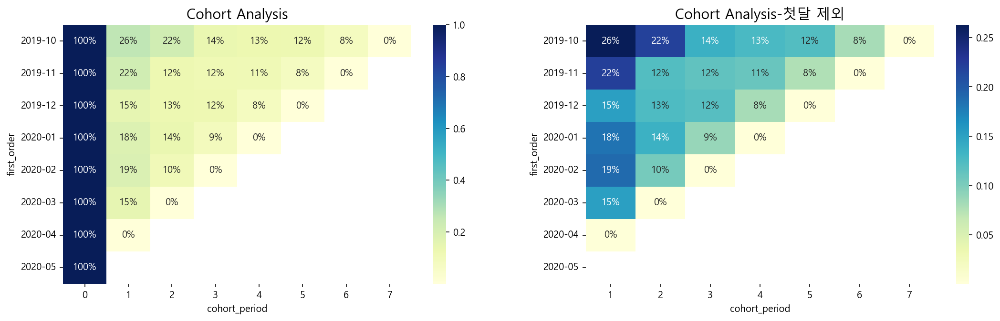

In [55]:
#코호트 시각화
fig = plt.figure(figsize=(18, 5))

fig.add_subplot(121)
plt.title('Cohort Analysis', fontsize=15)
sns.heatmap(user_retention, annot=True, fmt='.00%', cmap='YlGnBu')

fig.add_subplot(122)
plt.title('Cohort Analysis-첫달 제외', fontsize=15)
sns.heatmap(user_retention.loc[:,1:], annot=True, fmt='.00%', cmap='YlGnBu')

plt.show()

- 반등되는지점이 없어서 재구매 주기 확인이 어려움

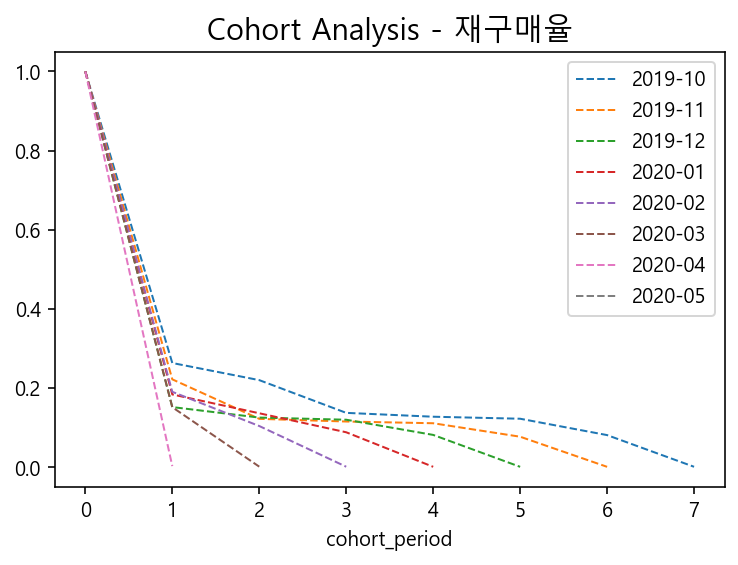

In [56]:
# line plot
for idx in user_retention.index:
    user_retention.loc[idx].plot(ls='--', lw=1)

plt.title('Cohort Analysis - 재구매율', fontsize=15)
plt.legend()
plt.show()

### 구매액 기준 
- 2019년 10월 및 11월 구매자의 경우 구매액 반등지점 발생
    - 2019년 10월 구매자의 반등지점 -> 구매 후 4개월 (20년 2월)
    - 2019년 11월 구매자의 반등지점 -> 구매 후 3개월 (20년 2월)
    - 20년 2월에 이벤트 있어서 금액이 반등 했다고 볼 수 있나?

In [58]:
# 월별 데이터셋 합치기
df = pd.concat([oct_,nov_,dec_,jan_,feb_,mar_,apr_])

# 첫 구매 시기에 대한 컬럼 생성
FirstOrder = df.groupby(df.index)['order_period'].min()
# FirstOrder=FirstOrder.dt.strftime('%Y-%m')
df['first_order']=FirstOrder
df = df.reset_index()

#코호트 기간으로 집계
grouped = df.groupby(['first_order','order_period'])
cohorts = grouped['price'].sum()
cohorts = cohorts.reset_index()
cohorts = cohorts.rename({'price':'sales_amount'},axis=1)
cohorts

,first_order,order_period,sales_amount
0,2019-10,2019-10,2.292716e+08
1,2019-10,2019-11,9.203145e+07
2,2019-10,2019-12,8.362678e+07
3,2019-10,2020-01,5.078462e+07
4,2019-10,2020-02,5.330695e+07
5,2019-10,2020-03,4.051780e+07
6,2019-10,2020-04,1.733492e+07
7,2019-10,2020-05,6.930469e+04
8,2019-11,2019-11,1.828929e+08
9,2019-11,2019-12,7.165731e+07


In [60]:
# 기간별 정렬
each_period=cohorts['first_order'].value_counts().sort_index()

In [61]:
# 기간별 레이블 붙이기 
cohortperiod=[]
for x in each_period: 
    for y in range(x):
        cohortperiod.append(y)

cohorts['cohort_period']=cohortperiod
cohorts = cohorts.set_index(['first_order','cohort_period'])

# FirstOrder(동일한 경험)와 CohortPeriod(동일한 기간)으로 인덱스로 만들어줍니다.
cohorts=cohorts['sales_amount'].unstack(1)

# 퍼센트로 값 변경
user_retention=cohorts.divide(cohorts[0],axis=0)
user_retention

cohort_period,0,1,2,3,4,5,6,7
first_order,,,,,,,,
2019-10,1.0,0.401408,0.364750,0.221504,0.232506,0.176724,0.075609,0.000302
2019-11,1.0,0.391799,0.206400,0.222936,0.169237,0.082149,0.000392,NaN
2019-12,1.0,0.257281,0.227899,0.173311,0.083809,0.000339,NaN,NaN
2020-01,1.0,0.379388,0.227844,0.091973,0.000397,NaN,NaN,NaN
2020-02,1.0,0.286368,0.096270,0.000379,NaN,NaN,NaN,NaN
2020-03,1.0,0.179104,0.000543,NaN,NaN,NaN,NaN,NaN
2020-04,1.0,0.002177,NaN,NaN,NaN,NaN,NaN,NaN
2020-05,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


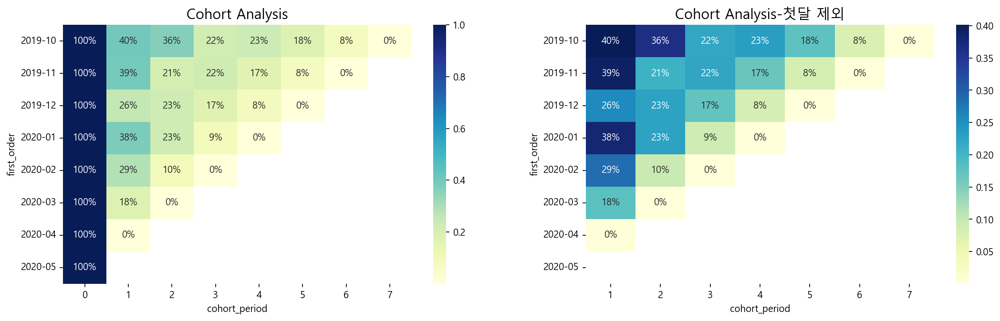

In [67]:
#코호트 시각화
fig = plt.figure(figsize=(18, 5))

fig.add_subplot(121)
plt.title('Cohort Analysis', fontsize=15)
sns.heatmap(user_retention, annot=True, fmt='.00%', cmap='YlGnBu')

fig.add_subplot(122)
plt.title('Cohort Analysis-첫달 제외', fontsize=15)
sns.heatmap(user_retention.loc[:,1:], annot=True, fmt='.00%', cmap='YlGnBu')

plt.show()

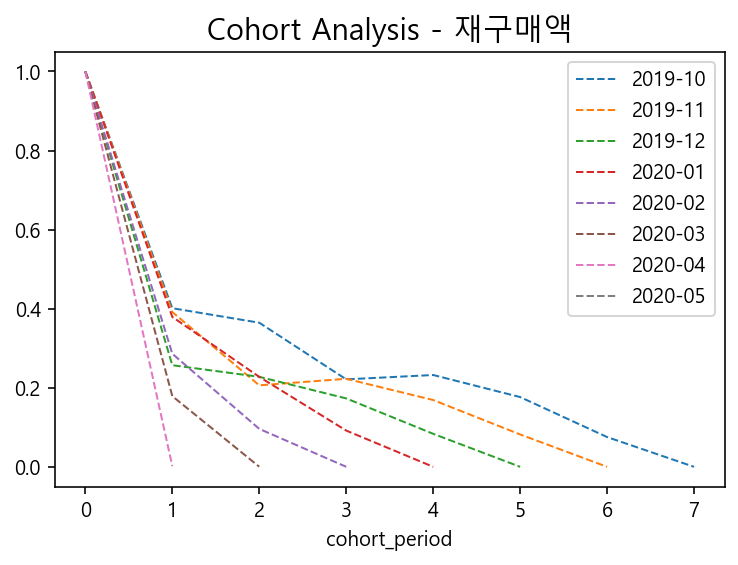

In [66]:
# line plot

for idx in user_retention.index:
    user_retention.loc[idx].plot(ls='--', lw=1)

plt.title('Cohort Analysis - 재구매액', fontsize=15)
plt.legend()
plt.show()

### 재구매율 - 스마트폰 구매고객 vs 비구매고객

- 스마트폰 매출이 전체 매출의 대부분을 차지 (수치 추가)
- 스마트폰 구매고객과 구매이력 없는 고객의 특성 비교 

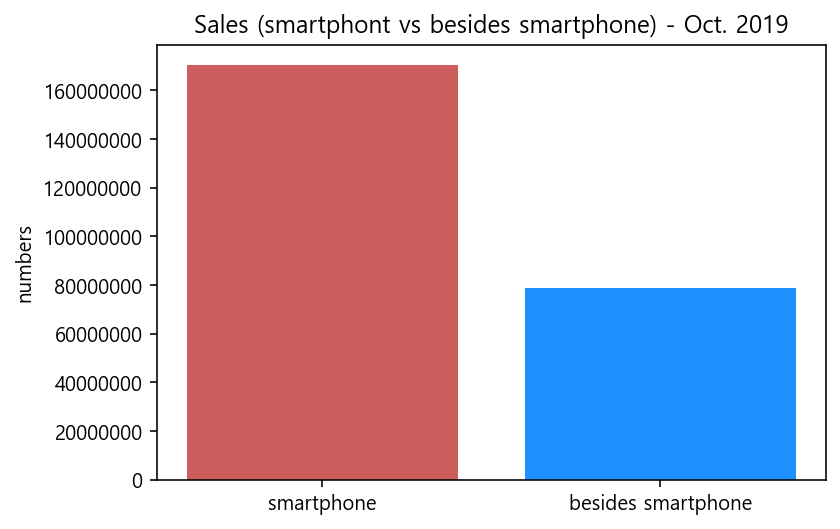

In [69]:
# 매출 계산
스마트폰매출_10월 = df_19_oct[(df_19_oct.event_type=='purchase') &(df_19_oct.category_code=='electronics.smartphone')]['price'].sum()
비스마트폰매출_10월 = df_19_oct[(df_19_oct.event_type=='purchase') & ~(df_19_oct.category_code=='electronics.smartphone')]['price'].sum()

# 시각화
x = ['smartphone', 'besides smartphone']
y = [스마트폰매출_10월, 비스마트폰매출_10월]
plt.bar(x,y, color=['indianred','dodgerblue'])
plt.title('Sales (smartphont vs besides smartphone) - Oct. 2019')
plt.ylabel('numbers')
plt.ticklabel_format(axis='y',style='plain')
plt.show()

- 스마트폰 구매고객
    - 2달만에 재구매율 0%에 수렴
    - 스마트폰 구매고객은 스마트폰 외의 제품을 해당 플랫폼에서 구매하지 않는다? 

In [118]:
# 스마트폰 구매고객
def df_making_4_cohort(df):
    '''
    코호트 분석을 위한 데이터프레임 전처리
    '''
    tmp = df[['event_time', 'event_type','user_id','category_code','price']]
    # 구매자들 중 휴대폰 구매한적 있는 사람
    tmp = tmp[(tmp.event_type == 'purchase')] 
    user_list = set(tmp[(tmp.category_code == 'electronics.smartphone')]['user_id'])
    tmp = tmp[(tmp.user_id.isin(user_list))]
    
    #단위 기간 만들기
    tmp['order_period'] = tmp['event_time'].dt.strftime('%Y-%m')    
    tmp = tmp.drop(['event_type','category_code'], axis=1)
    tmp = tmp.reset_index(drop=True).reset_index()
    tmp = tmp.rename(columns={'index':'order_id'}) # order id 부여
    tmp = tmp.set_index('user_id') 
    
    return tmp

In [119]:
# 월별 데이터프레임 전처리
oct_ = df_making_4_cohort(df_19_oct)
nov_ = df_making_4_cohort(df_19_nov)
dec_ = df_making_4_cohort(df_19_dec)
jan_ = df_making_4_cohort(df_20_jan)
feb_ = df_making_4_cohort(df_20_feb)
mar_ = df_making_4_cohort(df_20_mar)
apr_ = df_making_4_cohort(df_20_apr)

In [120]:
# 월별 데이터셋 합치기
df = pd.concat([oct_,nov_,dec_,jan_,feb_,mar_,apr_])

# 첫 구매 시기에 대한 컬럼 생성
FirstOrder = df.groupby(df.index)['order_period'].min()
# FirstOrder=FirstOrder.dt.strftime('%Y-%m')
df['first_order']=FirstOrder
df = df.reset_index()

#코호트 기간으로 집계
grouped = df.groupby(['first_order','order_period'])
cohorts = grouped['user_id'].nunique()
cohorts = cohorts.reset_index()
cohorts = cohorts.rename({'user_id':'total_users'},axis=1)

In [121]:
# 기간별 정렬 및 결측치 확인
each_period=cohorts['first_order'].value_counts().sort_index()

# 기간별 레이블 붙이기 
cohortperiod=[]
for x in each_period: 
    for y in range(x):
        cohortperiod.append(y)

cohorts['cohort_period']=cohortperiod
cohorts = cohorts.set_index(['first_order','cohort_period'])

# FirstOrder(동일한 경험)와 CohortPeriod(동일한 기간)으로 인덱스로 만들어줍니다.
cohorts=cohorts['total_users'].unstack(1)

# 퍼센트로 값 변경
user_retention=cohorts.divide(cohorts[0],axis=0)

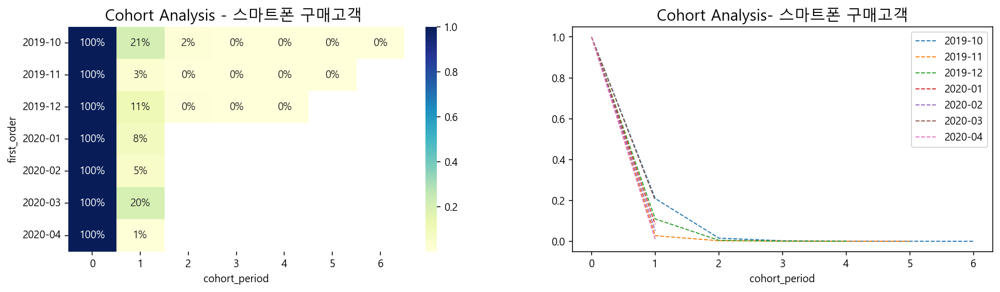

In [122]:
#코호트 시각화
fig = plt.figure(figsize=(16, 4))

fig.add_subplot(121)
plt.title('Cohort Analysis - 스마트폰 구매고객 ', fontsize=15)
sns.heatmap(user_retention, annot=True, fmt='.00%', cmap='YlGnBu')


# line plot
fig.add_subplot(122)
for idx in user_retention.index:
    user_retention.loc[idx].plot(ls='--', lw=1)

plt.title('Cohort Analysis- 스마트폰 구매고객', fontsize=15)
plt.legend()

plt.show()

- 스마트폰 비구매 고객
    - 스마트폰 구매고객대비 재구매율이 높음

In [113]:
# 전처리함수
def df_making_4_cohort(df):
    '''
    코호트 분석을 위한 데이터프레임 전처리
    '''
    tmp = df[['event_time', 'event_type','user_id','category_code','price']]
    # 구매자들 중 휴대폰 구매 한적 없는 사람
    tmp = tmp[(tmp.event_type == 'purchase')] 
    user_list = set(tmp[(tmp.category_code == 'electronics.smartphone')]['user_id'])
    tmp = tmp[~(tmp.user_id.isin(user_list))]
    
    #단위 기간 만들기
    tmp['order_period'] = tmp['event_time'].dt.strftime('%Y-%m')    
    tmp = tmp.drop(['event_type','category_code'], axis=1)
    tmp = tmp.reset_index(drop=True).reset_index()
    tmp = tmp.rename(columns={'index':'order_id'}) # order id 부여
    tmp = tmp.set_index('user_id') 
    
    return tmp

In [114]:
# 전처리 실행
oct_ = df_making_4_cohort(df_19_oct)
nov_ = df_making_4_cohort(df_19_nov)
dec_ = df_making_4_cohort(df_19_dec)
jan_ = df_making_4_cohort(df_20_jan)
feb_ = df_making_4_cohort(df_20_feb)
mar_ = df_making_4_cohort(df_20_mar)
apr_ = df_making_4_cohort(df_20_apr)

In [115]:
# 월별 데이터셋 합치기
df = pd.concat([oct_,nov_,dec_,jan_,feb_,mar_,apr_])

# 첫 구매 시기에 대한 컬럼 생성
FirstOrder = df.groupby(df.index)['order_period'].min()
# FirstOrder=FirstOrder.dt.strftime('%Y-%m')
df['first_order']=FirstOrder
df = df.reset_index()

#코호트 기간으로 집계
grouped = df.groupby(['first_order','order_period'])
cohorts = grouped['user_id'].nunique()
cohorts = cohorts.reset_index()
cohorts = cohorts.rename({'user_id':'total_users'},axis=1)

In [116]:
# 기간별 정렬 및 결측치 확인
each_period=cohorts['first_order'].value_counts().sort_index()

# 기간별 레이블 붙이기 
cohortperiod=[]
for x in each_period: 
    for y in range(x):
        cohortperiod.append(y)

cohorts['cohort_period']=cohortperiod
cohorts = cohorts.set_index(['first_order','cohort_period'])

# FirstOrder(동일한 경험)와 CohortPeriod(동일한 기간)으로 인덱스로 만들어줍니다.
cohorts=cohorts['total_users'].unstack(1)

# 퍼센트로 값 변경
user_retention=cohorts.divide(cohorts[0],axis=0)

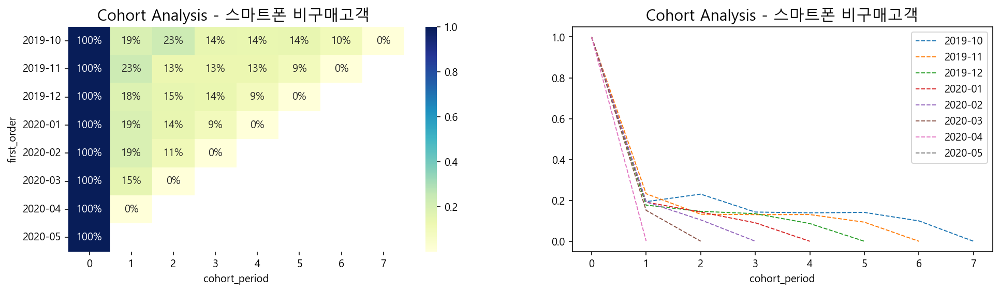

In [117]:
#코호트 시각화
fig = plt.figure(figsize=(16, 4))

fig.add_subplot(121)
plt.title('Cohort Analysis - 스마트폰 비구매고객 ', fontsize=15)
sns.heatmap(user_retention, annot=True, fmt='.00%', cmap='YlGnBu')


# line plot
fig.add_subplot(122)
for idx in user_retention.index:
    user_retention.loc[idx].plot(ls='--', lw=1)

plt.title('Cohort Analysis - 스마트폰 비구매고객', fontsize=15)
plt.legend()

plt.show()

## 기타 분석

### 신규고객 vs 기존고객

### 스마트폰 제조사별

- 2019년 10월 직전에 아이폰 출시
    - 10월 아이폰 매출에 영향 미쳤을수도
        - 월별 아이폰 매출경향 살펴봐야 
    - 카자흐스탄 아이폰 출시일 - 2019년 9월 29일
    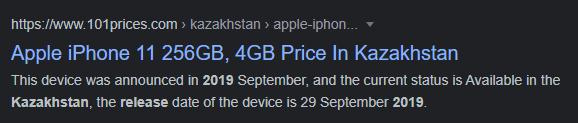
    - 갤럭시 S10 출시일 - 2019년 3월 5일
    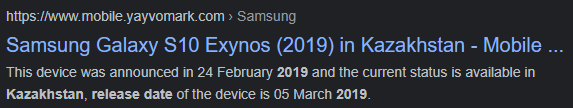

- 카자흐스탄 스마트폰 점유율 2019년 10월     
(출처: statcounter)
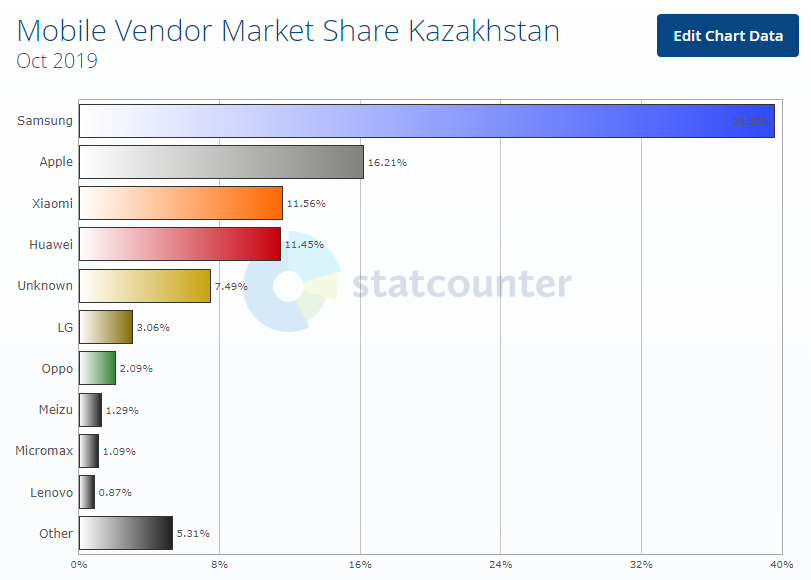

- 판매대수는 삼성 -> 애플 -> 샤오미 순
- 매출액은 애플 -> 삼성 -> 샤오미
    - 애플의 매출액이 삼성의 2배이상
    - 신규모델 출시효과인지 확인필요
        - 2019년 10월 이후 경향 확인 필요

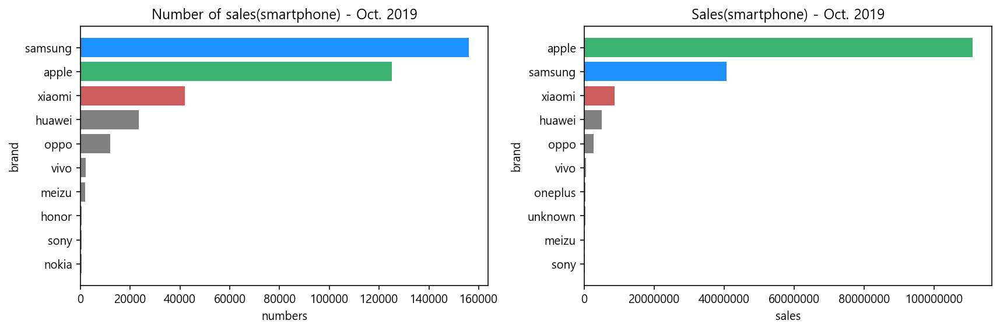

In [97]:
# 2019년 10월 판매대수 및 매출액

fig = plt.figure(figsize=(12,4))

fig.add_subplot(121)
tmp = df_19_oct[(df_19_oct.event_type=='purchase') &(df_19_oct.category_code=='electronics.smartphone')]['brand'].value_counts(ascending=True).tail(10)

color = ['gray']*7  + ['indianred', 'mediumseagreen', 'dodgerblue']
plt.barh(tmp.index,tmp.values, color = color )
plt.title('Number of sales(smartphone) - Oct. 2019')
plt.xlabel('numbers')
plt.ylabel('brand')


fig.add_subplot(122)
tmp = df_19_oct[(df_19_oct.event_type=='purchase') &(df_19_oct.category_code=='electronics.smartphone')].groupby('brand')['price'].sum().sort_values().tail(10)

color = ['gray']*7  + ['indianred', 'dodgerblue', 'mediumseagreen']
plt.barh(tmp.index,tmp.values, color=color)
plt.title('Sales(smartphone) - Oct. 2019')
plt.xlabel('sales')
plt.ylabel('brand')
plt.ticklabel_format(axis='x',style='plain') #y축 과학표기 제거

plt.tight_layout()
plt.show()

- 스마트폰 제조사별 vs 월별 판매대수 / 매출액 분석 추가 

---

# Summary

## view -> cart 구매전환율 개선 필요 
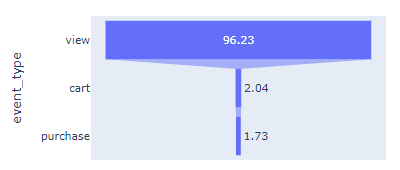

##  electronics를 제외한 카테고리의 경쟁력 확보 필요
- **멀티카테고리 커머스를 지향하지만, 매출이 electronics 제품이 집중되어 있음**
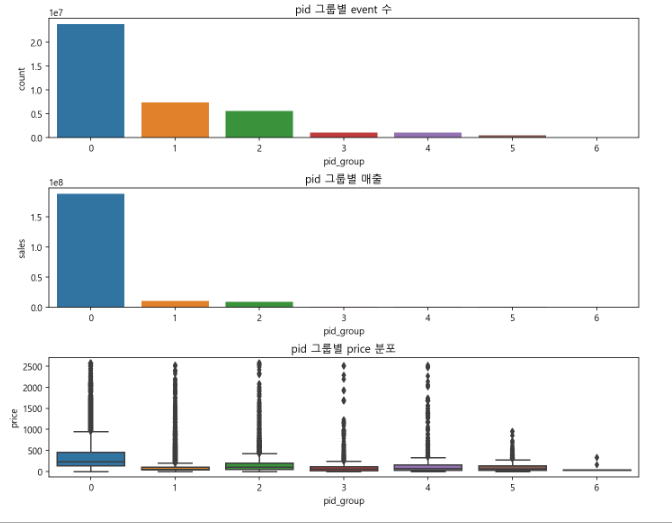
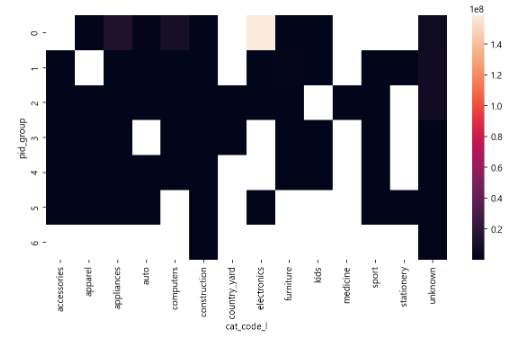

- **특히 apple 상품을 구매하는 특정 user집단에 매출이 집중되어 있음**
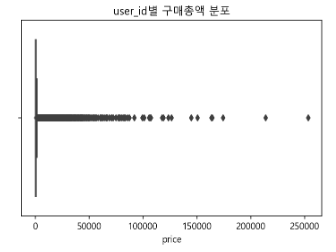
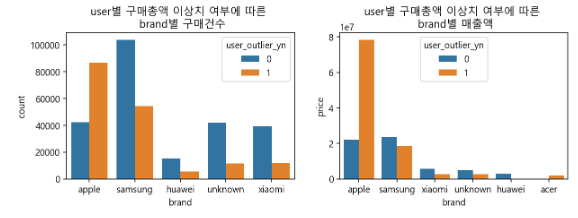

## 구매 event 효과 유효
- **event가 있었던 42주차를 기점으로 평균 구매 금액이 상승 후 유지**
    
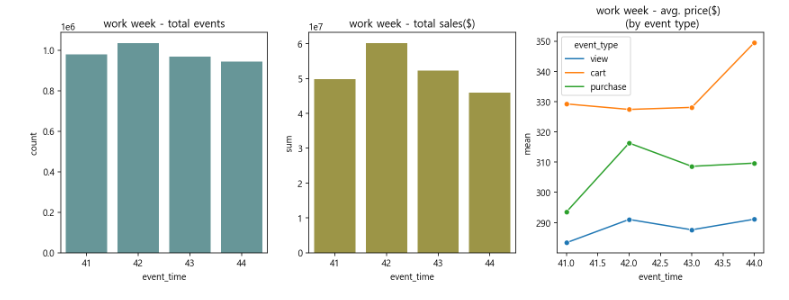
- **하지만 월말의 경우 event수는 증가하지만 구매액은 감소추세**
    - 11월 이후 데이터를 통한 추이 확인 필요

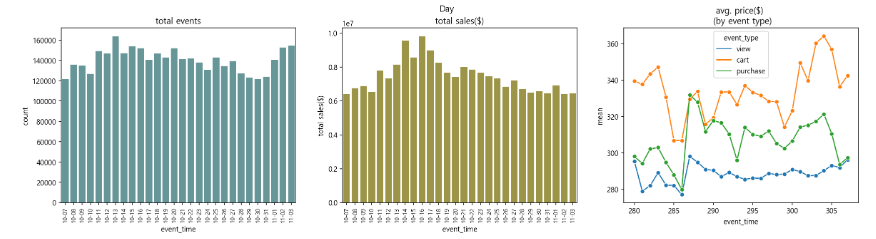

---

# 개선 예정 사항

## 잔여 데이터셋 (2019년 11월 ~2020년 4월) 추가 분석 - 진행중

## 가설검정 적용

## user_session을 활용한 추가 분석

## 코호트 분석 - 진행 중

- 특정 기간 특정의 경험을 공유한 집단간 행동패턴을 비교/분석
- 사용자 유지와 이탈 패턴 분석 및 코호트 간 상이한 행동 패턴 분석에 사용
- 월별 그룹으로 분석
    - 기존 설치자 매출은 줄어드는 반면 신규 설치자의 첫 달 매출액은 증가

## AARRR 분석
- Acquisition(획득)
    - 적은 비용으로 다수의 유입을 만드는 것이 좋은 채널
    - KPI : 앱 설치수, DAU, 신규 방문자수, 유입경로 등
    
- Activaation(활성화)
    - WoW 모먼트를 얼만큼 빠르게 보여줄 수 있느냐?
    - 수 많은 A/B test를 통해 
    - KPI : 페이지 뷰, 페이지 체류시간, 이벤트 클릭수, 쿠폰 발행 수, 사이트 내 행동지표 등
    
- Retention(재방문/재구매), 회사의 매출에 큰 영향
    - (참고) 신규 고객의 획득비용은 재구매 고객 획득 비용에 비해 5~25배 의 비용이 든다. (Harvard Business Review)
    - KPI : 재방문율, 재구매율, 구독률 등
    
- Referral(추천/공유)
    - 보통 고객이 서비스에 대해 매우 만족한 직후에 추천이 일어난다. 
    - 적절한 타이밍에 추천/공유를 유도한다.
    - KPI : 추천가입률, 추천 프로그램의 성과
    
- Revenue(매출/수익)
    - KPI : 일 매출, 주간/월간 매출, LTV(Life Time Value) 등
        

(참고)
- LTV(or CLV)
![image](https://user-images.githubusercontent.com/65796882/196660118-d7ff5fb8-3d3a-407d-87c5-4c6bf1c121d6.png)

1. ARPPU(Average Revenue Per Paid User) 객단가
    - 일매출/ Paid user 수 
2. Churn rate(이탈율)
    - SaaS, 구독기반 비즈니스에서 중요한 지표 
    - 이탈의 설정
        - N일간 미 방문, 구독 취소, 재결제 취소, 앱삭제 등
    - 보통 월별비교, 증감분석 한다.

![image](https://user-images.githubusercontent.com/65796882/196664492-46a80ecb-708b-4260-84d5-40be22e79cc6.png)
(출처: https://recurly.com/blog//better-way-to-calculate-your-churn-rate/)

- CAC(Customer Acqusition Cost)
    - CAC < LTV : 올바른 방향 
    - CAC > LTV : 재점검 필

- 메모리가 너무 커서, 컴퓨터 재부팅을 계속 했었어야 했는데, 이것때문에 시간 많이 잡아먹음 어떻게 해결할 수 있을지?
    - 필요한 컬럼만 사용
    - 샘플링
    - 전처리 노트 별도 생성, 필요한 부분 생길때마다 추가해서 데이터셋으로 저장
        - 버전별로 어떤내용 업데이트 됐는지 기록 하는 것도 좋겠다.
            - 버전을 다 저장하기에는 스토리지 용량낭비?
        - 버전 정보 기록 필수 
    


---